In [1]:
import numpy as np
import pandas as pd
from pathlib import Path
import utils
import elm
import models
import metrics
import prophet
import timegpt
import plotting
import main
import menu
import reconciliation

# Explication

## Code

### 1. Introduction

This document provides a detailed breakdown of a Python-based forecasting pipeline designed to predict energy production. The program compares several forecasting strategies, including **SISO** (Single-Input Single-Output), **MIMO** (Multi-Input Multi-Output), and **MIMO-MH** (Multi-Input Multi-Output, Multi-Horizon).

A key feature of this pipeline is the implementation of **hierarchical forecast reconciliation**, which ensures that the forecasts are coherent (i.e., the sum of individual production sources equals the total production forecast).

The pipeline is highly interactive, allowing the user to select models and configure hyperparameters through a command-line menu. Finally, it generates comprehensive performance metrics and visualizations to compare the different models.

The project is structured into several modules, each with a specific responsibility:

-   **`main.py`**: The main script that orchestrates the entire pipeline.
-   **`menu.py`**: Handles the user-facing interactive menu.
-   **`utils.py`**: Contains utility functions for data loading and preprocessing.
-   **`elm.py`**: Implements the core Extreme Learning Machine (ELM) model.
-   **`models.py`**: Defines the different forecasting strategies (SISO, MIMO, etc.).
-   **`reconciliation.py`**: Implements the hierarchical reconciliation logic.
-   **`metrics.py`**: Contains functions for calculating performance metrics.
-   **`prophet.py` / `timegpt.py`**: Functions to integrate results from external models.
-   **`plotting.py`**: Handles all data visualization.

---

### 2. `utils.py` - Data Loading and Preprocessing

This module contains essential helper functions for the initial data handling steps.

#### `slugify(col: str) -> str`

-   **Purpose**: To clean and standardize a string, typically a DataFrame column name, into a URL-friendly "slug" format.
-   **Input**:
    -   `col` (str): The input string to be cleaned.
-   **Output**:
    -   (str): A cleaned, lowercase string with spaces replaced by underscores.
-   **Details**: This function is crucial for ensuring consistency in column names throughout the program. It removes special characters, converts the string to lowercase, and replaces spaces with underscores. This prevents errors that might arise from inconsistent or problematic column names (e.g., `Date (UTC)` becomes `date_utc`).

#### `load_and_preprocess_data(...) -> pd.DataFrame`

-   **Purpose**: To load the dataset from a CSV file and perform initial preprocessing steps.
-   **Inputs**:
    -   `file_path` (Path): The path to the input CSV file.
    -   `date_col` (str): The name of the column containing the dates.
    -   `drop_policy` (str): The strategy for handling duplicate timestamps (`'first'`, `'last'`, or `'mean'`).
-   **Output**:
    -   (pd.DataFrame): A preprocessed DataFrame, sorted by date, with a standardized `ds` datetime column.
-   **Details**: This is the first critical step in the pipeline. It performs the following actions:
    1.  Loads the data from the CSV.
    2.  Cleans all column names using the `slugify` function.
    3.  Converts the date column to a standardized datetime object named `ds`.
    4.  Handles duplicate timestamps based on the chosen policy (e.g., aggregating them by taking the mean).
    5.  Sorts the data by date to ensure the time series is in the correct order.

#### `prepare_data_mimo_mh(...) -> (np.array, np.array)`

-   **Purpose**: To transform a time series matrix into a supervised learning format suitable for the MIMO-MH (Multi-Horizon) model.
-   **Inputs**:
    -   `input_matrix` (np.array): The array of time series data.
    -   `num_rows` (int): Total number of rows in the matrix.
    -   `max_horizon` (int): The number of future steps to predict.
    -   `window_size` (int): The number of past time steps to use as input features.
    -   `num_outputs` (int): The number of variables to predict.
-   **Output**:
    -   `X_windows` (np.array): The input features, where each row is a flattened window of past observations.
    -   `Y_windows` (np.array): The target values, where each row is a flattened window of future values to be predicted.
-   **Details**: This function creates sliding windows over the time series data. For each sample, `X` consists of `window_size` past values, and `Y` consists of `max_horizon` future values. This structure allows a single model to learn the mapping from a sequence of past observations to a sequence of future predictions across multiple horizons.

---

### 3. `elm.py` - Extreme Learning Machine Model

This module implements the core machine learning model used for forecasting. An ELM is a type of feedforward neural network with a single hidden layer, known for its extremely fast training speed.

#### `train_elm(...) -> tuple`

-   **Purpose**: To train an ELM model. It supports multiple initializations to find the best-performing model on a test set.
-   **Inputs**:
    -   `X_train`, `Y_train` (np.array): Training data (features and targets).
    -   `X_test`, `Y_test` (np.array): Testing data for validation.
    -   `num_hidden` (int): The number of neurons in the hidden layer.
    -   `num_initializations` (int): The number of times to randomly initialize and train the model.
    -   `lambda_reg` (float): The regularization parameter (L2 regularization) for stability.
-   **Output**:
    -   `best_model` (tuple): A tuple containing the learned model parameters (`W`, `b`, `beta`) of the best-performing initialization.
-   **Details**: The ELM training process is non-iterative and very fast:
    1.  Input weights (`W`) and biases (`b`) are initialized *randomly* and are not trained.
    2.  The hidden layer output (`H`) is calculated by passing the input data through the hidden neurons.
    3.  The output weights (`beta`) are solved for analytically using a regularized least-squares solution.
    Since the initial weights are random, the function can run this process multiple times and keep the model that yields the lowest RMSE on the test set.

#### `predict_elm(X: np.array, model: tuple) -> np.array`

-   **Purpose**: To make predictions using a trained ELM model.
-   **Input**:
    -   `X` (np.array): The input data for which to generate predictions.
    -   `model` (tuple): The trained ELM model parameters (`W`, `b`, `beta`) returned by `train_elm`.
-   **Output**:
    -   `Y_pred` (np.array): The model's predictions.
-   **Details**: This function performs a forward pass through the ELM network using the trained parameters to generate the final output forecasts. Predictions are clipped at zero to ensure non-negative energy values.

---

### 4. `models.py` - Forecasting Strategies

This module defines the high-level functions that implement the different forecasting strategies.

#### `run_mimo_mh_all_horizons(...) -> pd.DataFrame`

-   **Purpose**: Implements the **MIMO-MH** strategy. It trains a *single* model that jointly predicts all output variables across all forecast horizons at once.
-   **Details**: This is the most holistic approach. One powerful model learns the complex relationships between all variables and their evolution over time. After training, it can optionally apply hierarchical reconciliation to the forecasts. The results are returned in a tidy DataFrame format.

#### `run_mimo_all_horizons(...) -> pd.DataFrame`

-   **Purpose**: Implements the **MIMO** strategy. It trains *one independent model for each forecast horizon*. Each model predicts all output variables for its specific horizon.
-   **Details**: This strategy involves a loop from `h = 1` to `max_horizon`. In each iteration, a new ELM model is trained to specialize in predicting `h` steps ahead. This is less complex than MIMO-MH but requires training multiple models. Reconciliation is applied as a post-processing step across the collected forecasts.

#### `run_siso_all_horizons(...) -> pd.DataFrame`

-   **Purpose**: Implements the **SISO** strategy. It trains *one independent model for each variable and each horizon*.
-   **Details**: This is the most granular and computationally intensive approach. For example, with 8 variables and 24 horizons, this function trains `8 * 24 = 192` separate models. Each model is highly specialized, learning to predict just one variable at a specific time step ahead. This strategy serves as a baseline to compare against more complex MIMO approaches.

---

### 5. `reconciliation.py` - Hierarchical Reconciliation

This module handles the logic for making forecasts coherent. In this context, coherence means that the sum of the forecasts for individual energy sources (e.g., thermal, hydro, solar) must equal the forecast for the total energy production.

#### `create_S_from_outputs(...) -> np.array`

-   **Purpose**: To create the "summing matrix" `S`.
\begin{equation}
S=
\begin{pmatrix}
    1 & 1 & 1 & 1 & 1 &1 & 1 \\ 
    1 & 0 & 0 & 0 & 0 & 0 & 0 \\
    0 & 1 & 0 & 0 & 0 & 0 & 0 \\
    0 &0 & 1 & 0 & 0& 0 & 0 \\
    0 & 0 & 0 & 1 & 0 & 0 & 0 \\
    0 & 0 & 0 & 0 & 1 & 0 & 0 \\
    0 & 0 & 0 & 0 & 0 & 1 & 0 \\
    0 & 0 & 0 & 0 & 0 & 0 & 1
\end{pmatrix}
\end{equation}
  
-   **Input**:
    -   `output_names` (list): A list of variable names, where the first name is the total and the rest are the bottom-level components.
-   **Output**:
    -   `S` (np.array): The summing matrix that defines the hierarchical structure.
-   **Details**: The `S` matrix mathematically describes the hierarchy. For example, it specifies that the "Total" series is the sum of all other series. This matrix is fundamental to the reconciliation algorithm.

#### `estimate_W_from_train_residuals(...) -> list`

-   **Purpose**: To estimate the covariance of the forecast errors from the training set residuals.
-   **Inputs**:
    -   `Y_true_mh_train`, `Y_pred_mh_train` (np.array): The true values and base forecasts on the training set.
-   **Output**:
    -   `W_list` (list): A list of covariance matrices (`W`), one for each forecast horizon.
-   **Details**: The MinT (Minimum Trace) reconciliation method uses the historical error patterns to optimally adjust the base forecasts. This function calculates the covariance of errors for each horizon, which is used to weigh the adjustments. Using only the diagonal (variances) is a common simplification that often works well in practice (WLS method).

#### `reconcile_all_horizons(...) -> np.array`

-   **Purpose**: To apply the MinT reconciliation formula to the base forecasts.
-   **Inputs**:
    -   `Y_pred_mh` (np.array): The incoherent base forecasts from a model.
    -   `S` (np.array): The summing matrix.
    -   `W_list` (list): The list of error covariance matrices.
-   **Output**:
    -   `Y_rec` (np.array): The reconciled, coherent forecasts.
-   **Details**: This function applies the core MinT formula `Y_reconciled = S * P * Y_base`, where `P` is a projection matrix derived from `S` and `W`. This transformation projects the incoherent base forecasts onto a space where they satisfy the hierarchical constraints defined by `S`.

---

### 6. `metrics.py` & External Model Modules

These modules are responsible for performance evaluation and integrating external models.

#### `compute_all_metrics(df: pd.DataFrame) -> pd.DataFrame`

-   **Purpose**: To calculate a comprehensive set of performance metrics from a results DataFrame.
-   **Details**: It groups the results by model, horizon, and output variable and computes key metrics like RMSE, MAE, R², and their normalized versions (nRMSE, nMAE). Normalization (dividing by the mean of the true values) is important for comparing performance across variables with different scales.

#### `stack_external_metrics(...) -> pd.DataFrame`

-   **Purpose**: To process and standardize results from external models (like Prophet) that are stored in a different format.
-   **Details**: This function is an adapter. It reads forecast files from other tools, extracts the true values and predictions, computes the same set of metrics, and returns them in a standardized DataFrame. This allows for a fair and direct comparison between the ELM models and external benchmarks.

#### `load_prophet_forecasts` & `load_timegpt_metrics`

-   **Purpose**: These are simple loader functions that read pre-computed forecast or metrics files from disk for Prophet and TimeGPT, respectively.

---

### 7. `plotting.py` - Visualization

This module contains all functions for generating plots to visualize model performance. All functions include logic to save the generated plots as image files.

#### `plot_metrics_subplots(...)`

-   **Purpose**: To create a 2x2 grid of plots showing key (non-normalized) metrics (RMSE, R², MAE, MBE) averaged across all output variables.
-   **Details**: This provides a high-level, aggregated view of how each model performs on average as the forecast horizon increases.

#### `plot_normalized_metrics_subplots(...)`

-   **Purpose**: Similar to the above, but for normalized metrics (nRMSE, R², nMAE, nMBE).
-   **Details**: This is often a more useful high-level comparison, as normalization makes the performance across different models more comparable.

#### `plot_all_metrics_by_energy_variable(...)`

-   **Purpose**: To create a detailed plot for each metric, showing the performance of all models on all variables simultaneously.
-   **Details**: On these plots, energy variables are distinguished by color, and models are distinguished by line style and marker. This allows for a rich, albeit potentially crowded, visual analysis.

#### `plot_metrics_by_variable_subplots(...)`

-   **Purpose**: To create a grid of subplots for each metric, where each subplot is dedicated to a single energy variable.
-   **Details**: This is a very clear and effective way to compare model performance. For example, you can look at the "nRMSE" figure and see a separate subplot for "solar," "wind," etc., each showing how the different models performed for that specific variable across the forecast horizon.

---

### 8. `menu.py` & `main.py` - Orchestration and User Interface

These modules control the program's execution flow and user interaction.

#### `menu.py`

-   **Purpose**: To provide an interactive command-line menu for the user.
-   **Details**: This module is responsible for displaying the list of available models and run configurations, getting the user's choice, and even handling a "custom selection" mode. The `select_models()` function returns a list of tasks for the main script to execute. This makes the tool flexible and user-friendly, as no code changes are needed to run different experiments.

#### `main.py`

-   **Purpose**: This is the main entry point and orchestrator of the entire pipeline.
-   **`CONFIG` Dictionary**: This global dictionary at the top of the file centralizes all key configuration parameters, such as file paths, date columns, variable names, and model hyperparameters.
-   **Helper Functions**:
    -   `get_hyperparameters()`: Interactively prompts the user to confirm or change key hyperparameters for the run.
    -   `process_results()`: A small utility to correctly format and store the results from each model run.
-   **`main()` Function**: This function executes the entire workflow in a logical sequence:
    1.  **Initialization**: Creates the `figures` directory.
    2.  **User Choices**: Calls `select_models()` from `menu.py` to determine what to run.
    3.  **Configuration**: Calls `get_hyperparameters()` if ELM models are selected.
    4.  **Step 1: Data Loading**: Calls `load_and_preprocess_data`.
    5.  **Step 2: Model Execution**: Loops through the user's choices and runs the corresponding forecasting models from `models.py`.
    6.  **Step 3: Metrics Calculation**: Computes metrics for the internally run models.
    7.  **Step 4: External Models**: Loads results for external models like Prophet and TimeGPT and computes their metrics.
    8.  **Aggregation**: Combines all metrics into a single DataFrame and saves it to `final_metrics_comparison.csv`.
    9.  **Step 5: Visualization**: Calls the functions from `plotting.py` to generate and save all the comparison plots.

### (MIMO + SISO + MIMO-MH) Base + REC


MODEL SELECTION MENU
--- Individual Models ---
 1 : Run SISO
 2 : Run MIMO
 3 : Run MIMO-MH

--- Reconciled (REC) Models Only ---
 4 : Run SISO-REC
 5 : Run MIMO-REC
 6 : Run MIMO-MH-REC

--- Combined Models (Base + Reconciled) ---
 7 : Run SISO (Base + REC)
 8 : Run MIMO (Base + REC)
 9 : Run MIMO-MH (Base + REC)
 10 : Run ALL ELM models (Base + REC)

--- External Models & Groups ---
 11 : Run Prophet + TimeGPT
 12 : Run ALL models (ELM Base + External)
 13 : Run ALL models (ELM REC + External)

--- Custom ---
 14 : Custom model selection


Please enter your choice (1-14):  14



CUSTOM MODEL SELECTION
Available models:
1: SISO
2: MIMO
3: MIMO-MH
4: PROPHET
5: TIMEGPT



Enter the numbers of the models to run, separated by a comma (e.g., 1,3,4):  1,2,3
  For SISO, run base, reconciled, or both? (n/y/b):  b
  For MIMO, run base, reconciled, or both? (n/y/b):  b
  For MIMO-MH, run base, reconciled, or both? (n/y/b):  b



Selected models: SISO, SISO-REC, MIMO, MIMO-REC, MIMO-MH, MIMO-MH-REC


Do you want to include persistence models in plots? (y/n):  n



HYPERPARAMETER CONFIGURATION


Enter the split date (YYYY-MM-DD) [default: 2021-01-01] (press Enter to use default):  
Enter the regularization lambda for ELM (e.g., 1e-6) [default: 1e-06] (press Enter to use default):  0.1
Enter the number of hidden neurons for ELM [default: 1000] (press Enter to use default):  
Enter the number of initializations for ELM [default: 1] (press Enter to use default):  


Final configuration used:
  - Split date: 2021-01-01
  - Lambda: 0.1
  - Hidden neurons: 1000
  - Initializations: 1

>>> Loading and pre-processing data...
    - Duplicates aggregated by taking the mean.
    - Data loaded successfully: 61361 rows, 12 columns.
>>> Data loading complete.

>>> Running forecasting models...
    - Running SISO model...
    - SISO model finished.
    -> Execution time for SISO: 364.31 seconds.
    - Running SISO-REC model...
        - Applying reconciliation...
    - SISO-REC model finished.
    -> Execution time for SISO-REC: 388.49 seconds.
    - Running MIMO model...
    - MIMO model finished.
    -> Execution time for MIMO: 121.19 seconds.
    - Running MIMO-REC model...
        - Applying reconciliation...
    - MIMO-REC model finished.
    -> Execution time for MIMO-REC: 120.75 seconds.
    - Running MIMO-MH model...
    - MIMO-MH model finished.
    -> Execution time for MIMO-MH: 59.95 seconds.
    - Running MIMO-MH-REC model...
        - Applying re

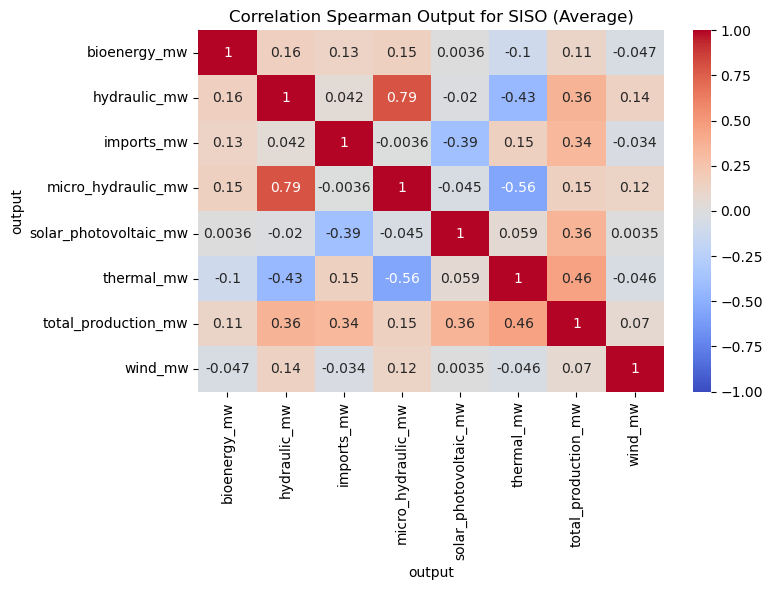

Figure saved: figures/correlation_spearman_output_SISO-REC.png


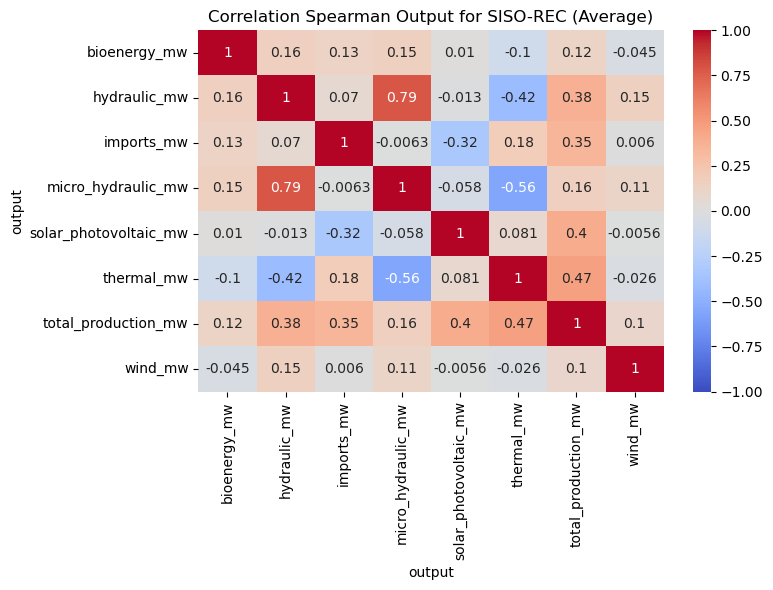

Figure saved: figures/correlation_spearman_output_MIMO.png


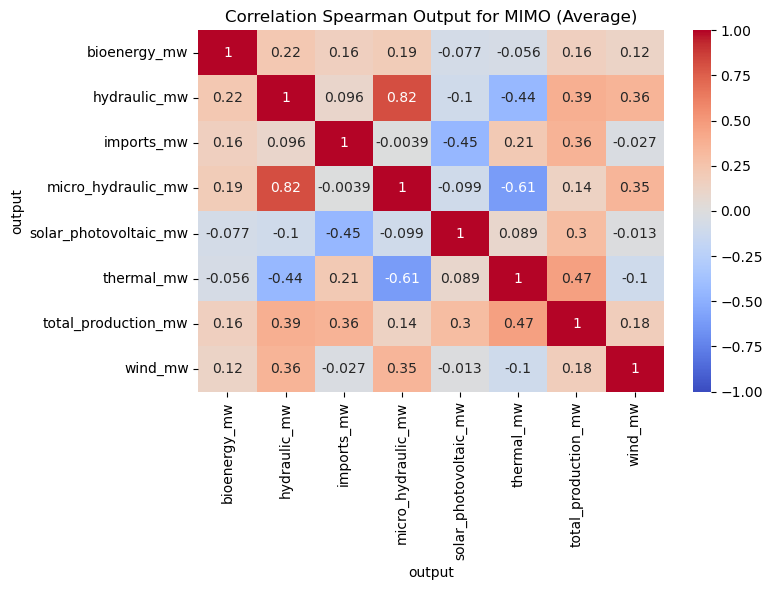

Figure saved: figures/correlation_spearman_output_MIMO-REC.png


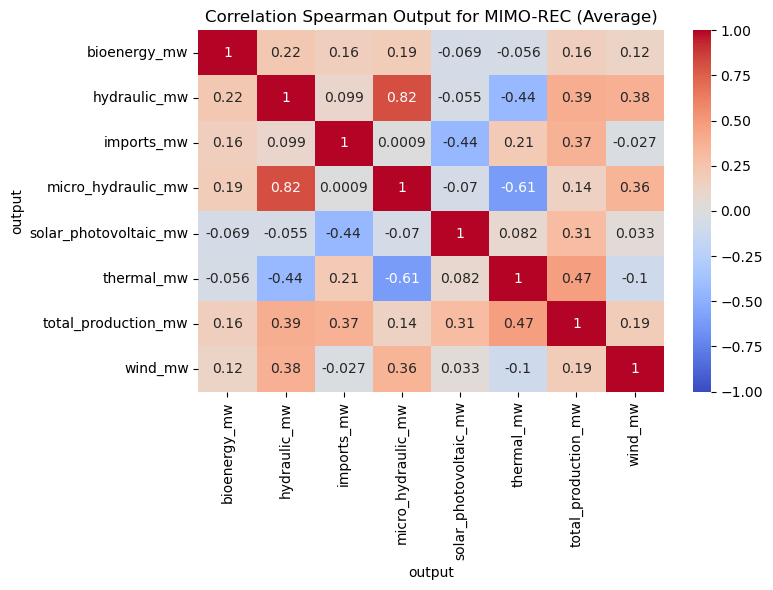

Figure saved: figures/correlation_spearman_output_MIMO-MH.png


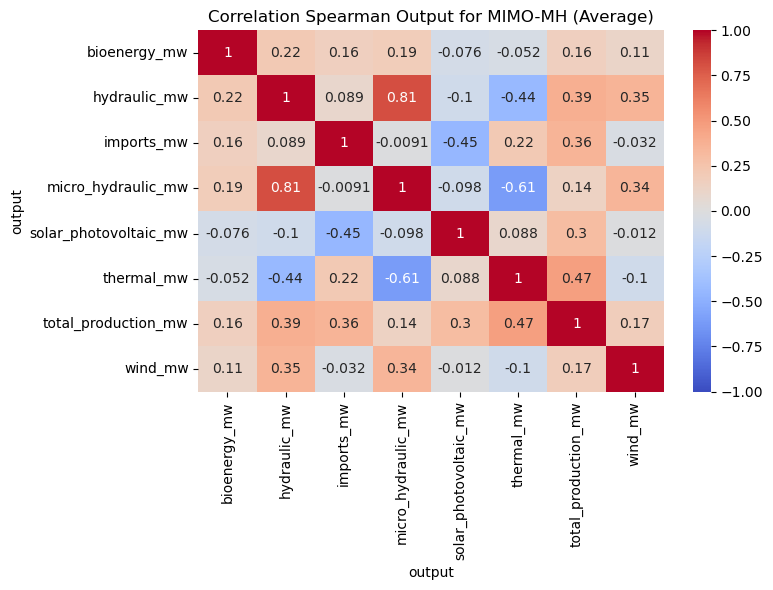

Figure saved: figures/correlation_spearman_output_MIMO-MH-REC.png


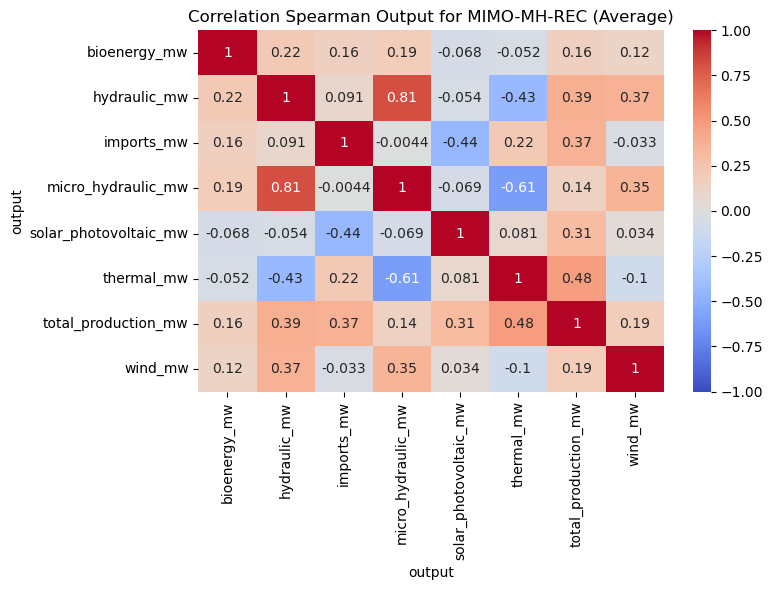

Figure saved: figures/correlation_spearman_horizon_SISO.png


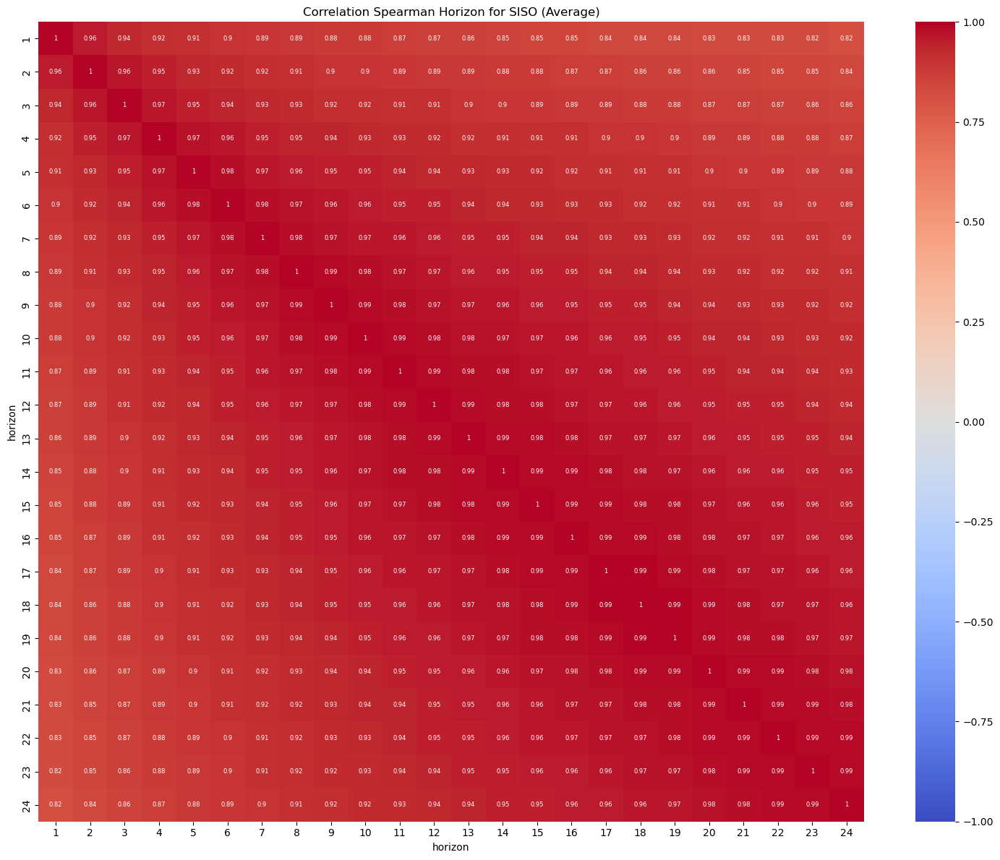

Figure saved: figures/correlation_spearman_horizon_SISO-REC.png


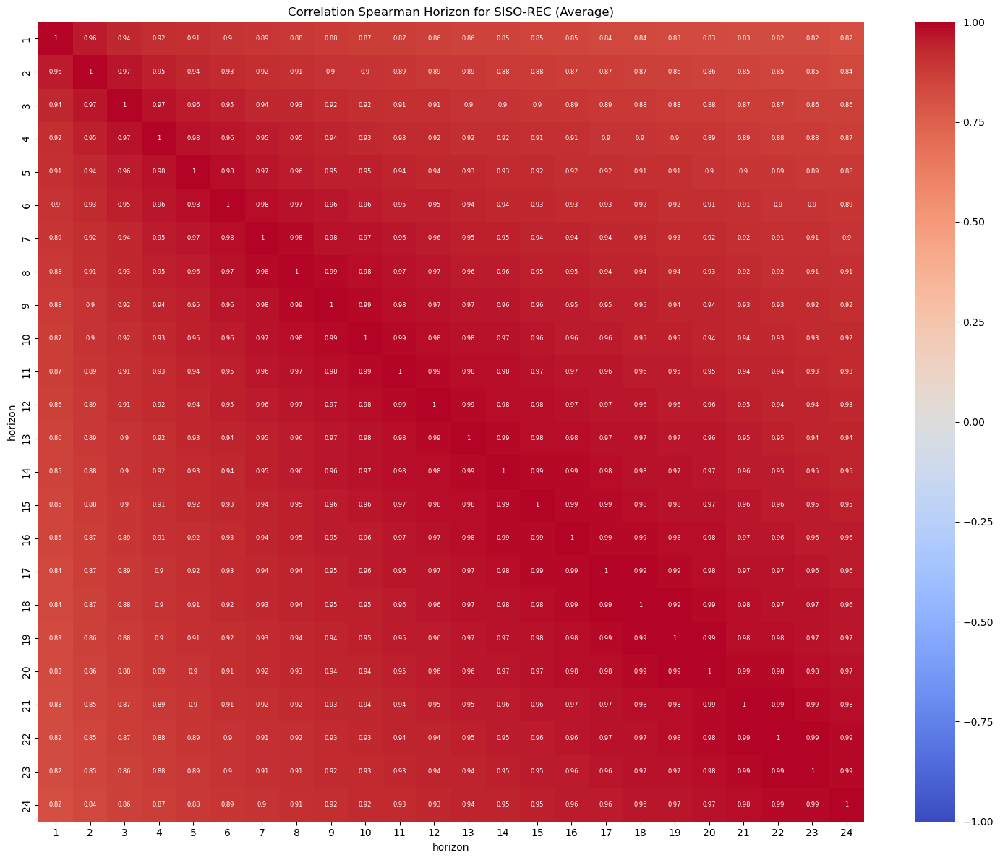

Figure saved: figures/correlation_spearman_horizon_MIMO.png


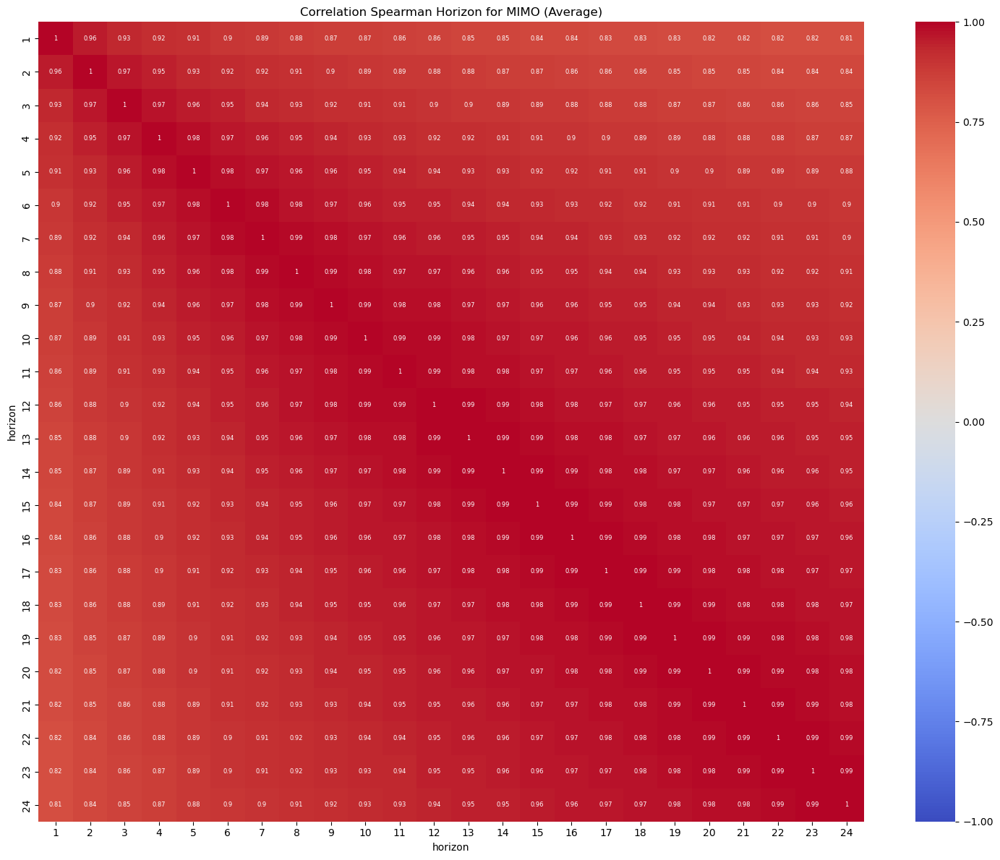

Figure saved: figures/correlation_spearman_horizon_MIMO-REC.png


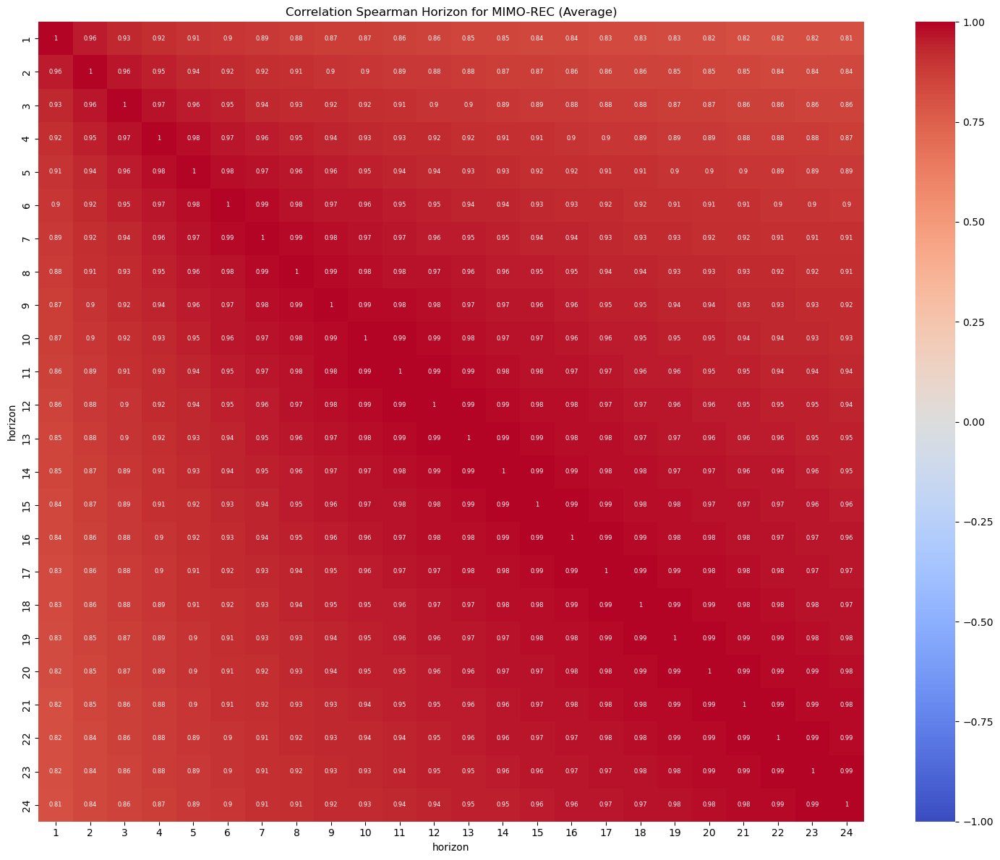

Figure saved: figures/correlation_spearman_horizon_MIMO-MH.png


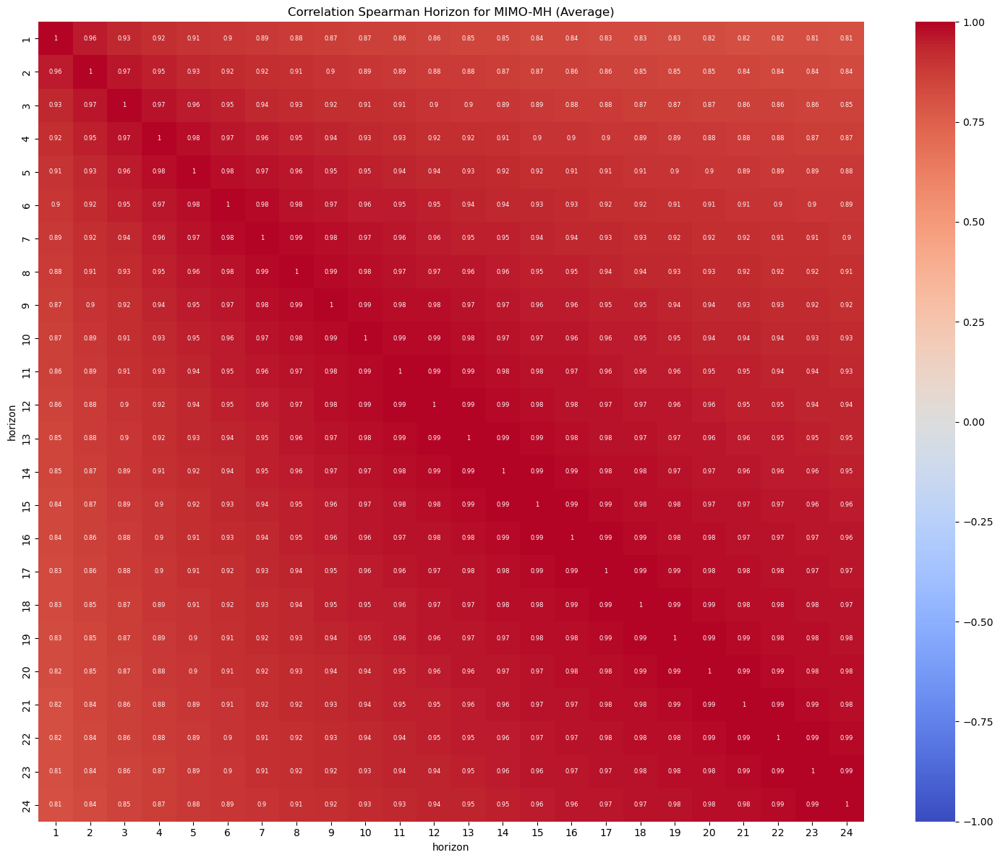

Figure saved: figures/correlation_spearman_horizon_MIMO-MH-REC.png


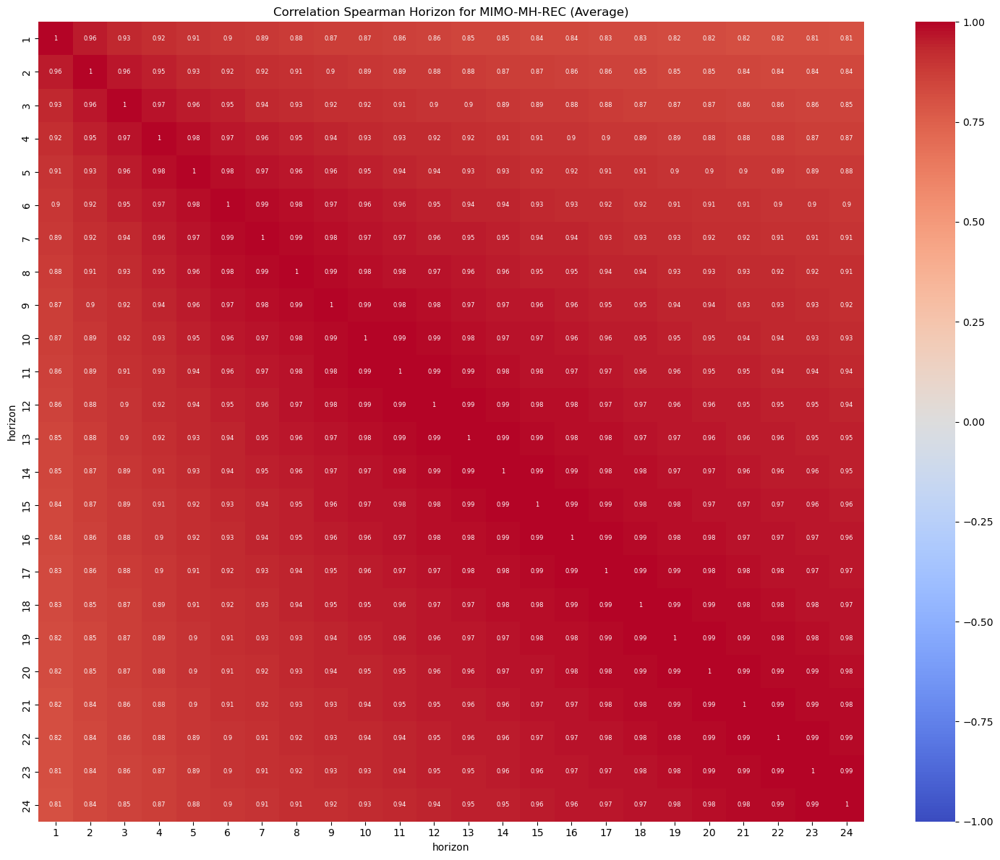

Figure saved: figures/pacf_solar_photovoltaic.png


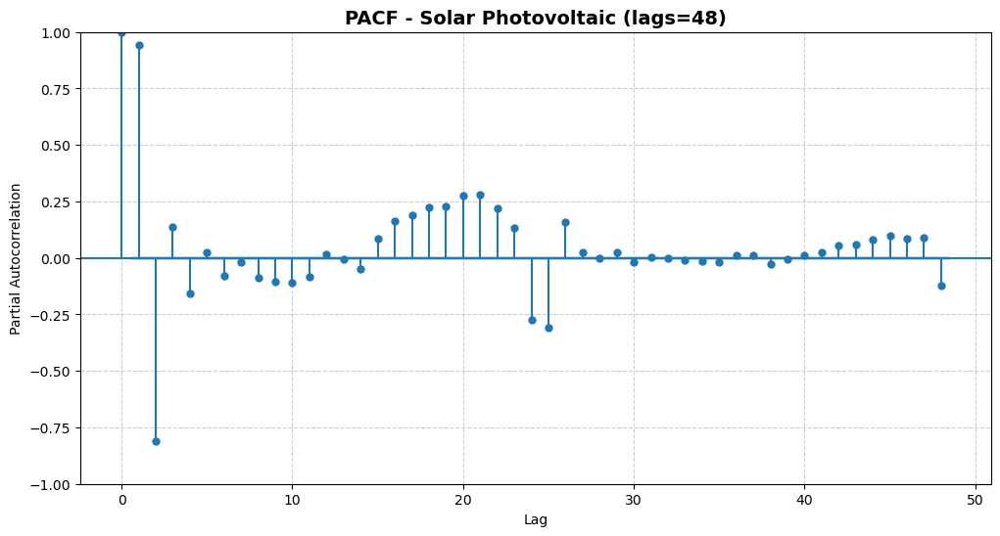

    - All model metrics have been combined.
>>>  External models processed.

    - Final metrics saved to 'final_metrics_comparison.csv'

>>> Final Metrics Comparison:
      model  horizon                output    nRMSE     nMAE      nMBE        R2      RMSE       MAE       MBE
       MIMO        1          bioenergy_mw 0.127513 0.067311  0.033271  0.950006  0.049029  0.025881  0.012793
    MIMO-MH        1          bioenergy_mw 0.128003 0.067658  0.033446  0.949320  0.049142  0.025975  0.012841
MIMO-MH-REC        1          bioenergy_mw 0.127893 0.067471  0.033294  0.949407  0.049100  0.025903  0.012782
   MIMO-REC        1          bioenergy_mw 0.127481 0.067249  0.033144  0.950031  0.049016  0.025857  0.012744
       SISO        1          bioenergy_mw 0.125500 0.059710  0.028800  0.951311  0.048318  0.022989  0.011088
   SISO-REC        1          bioenergy_mw 0.126153 0.060202  0.029396  0.950803  0.048570  0.023178  0.011318
       MIMO        2          bioenergy_mw 0.209396 0.1

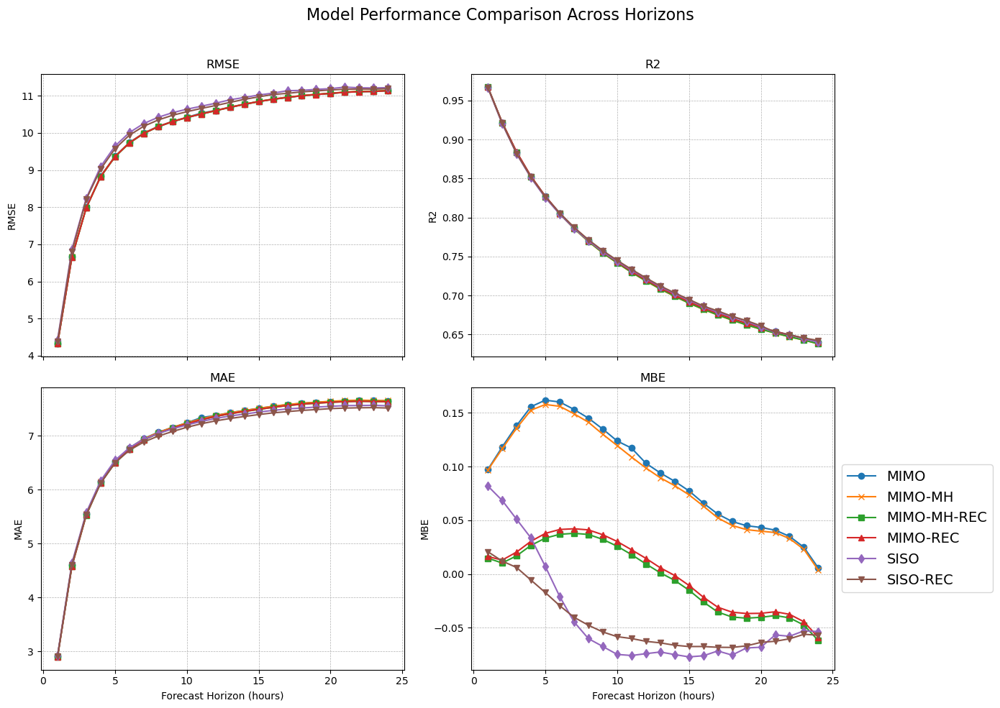

    - Generating Plot 2: Normalized Key Metrics Subplots (nRMSE, R2, nMAE, nMBE)...
Figure saved: figures/model_comparison_normalized_metrics.png


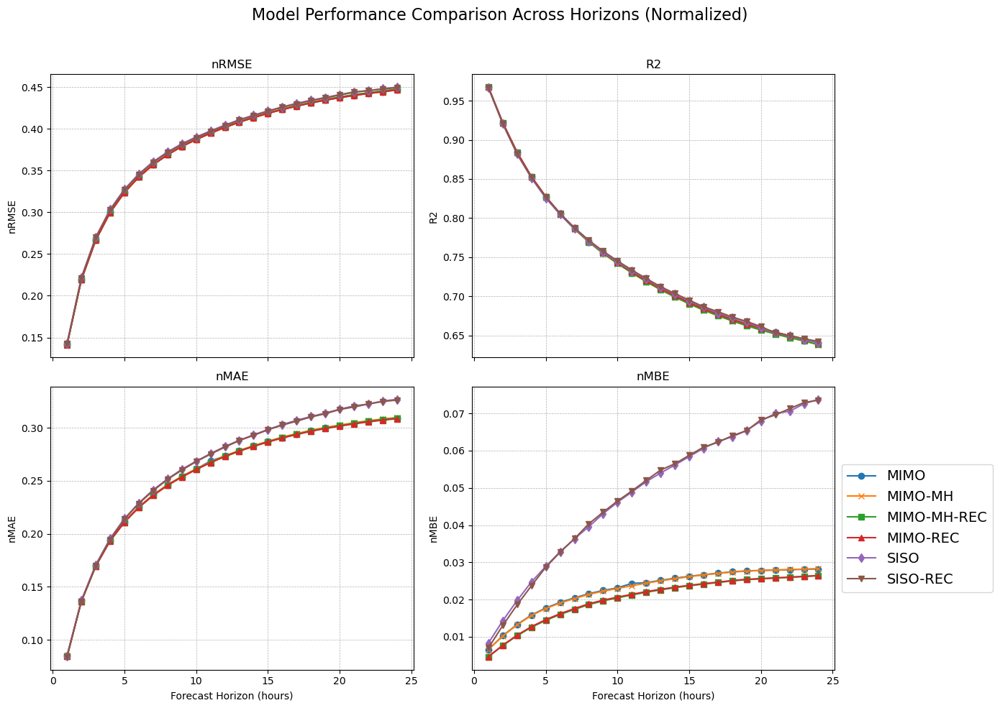

    - Generating Plot 3: Metrics by Energy Variable (Combined View)...
      - Plotting nRMSE...
Figure saved: figures/model_comparison_nrmse_by_variable.png


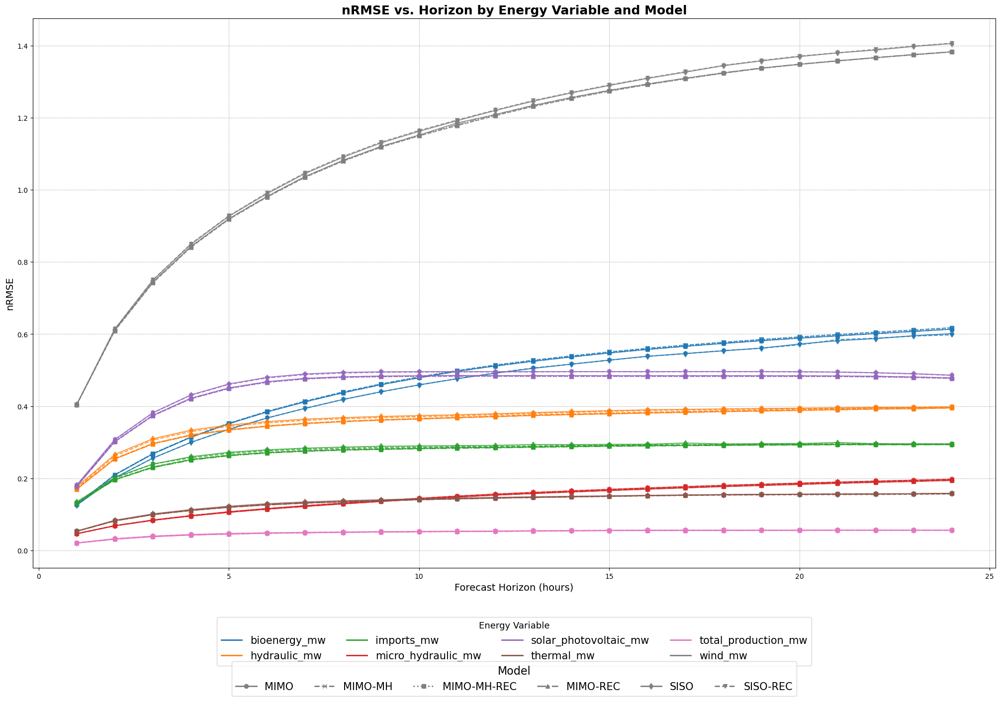

      - Plotting nMAE...
Figure saved: figures/model_comparison_nmae_by_variable.png


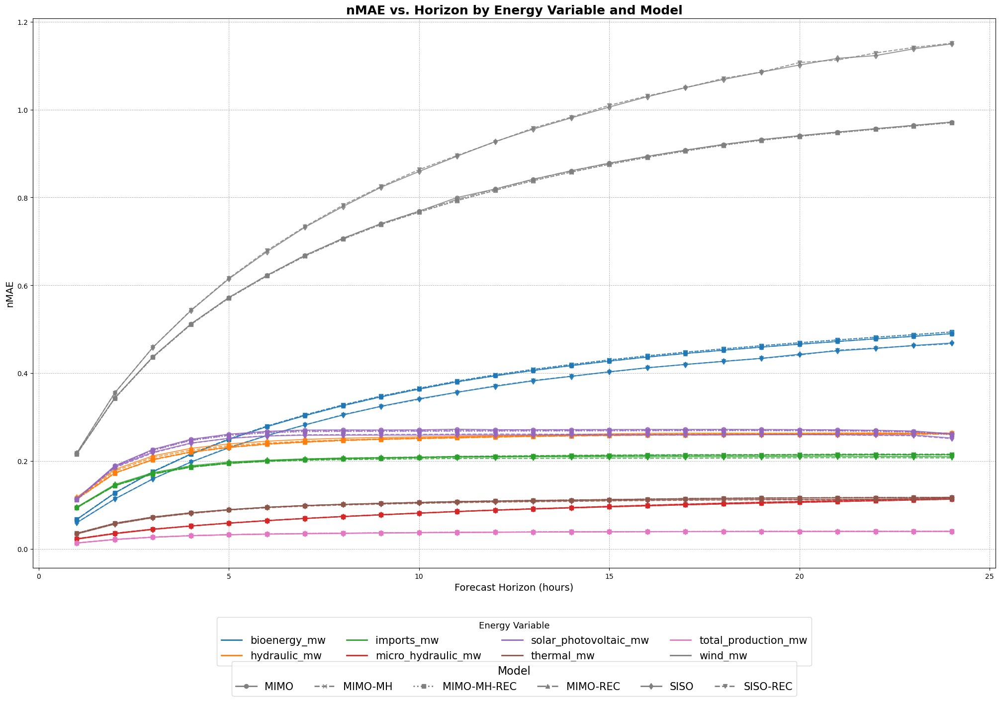

      - Plotting nMBE...
Figure saved: figures/model_comparison_nmbe_by_variable.png


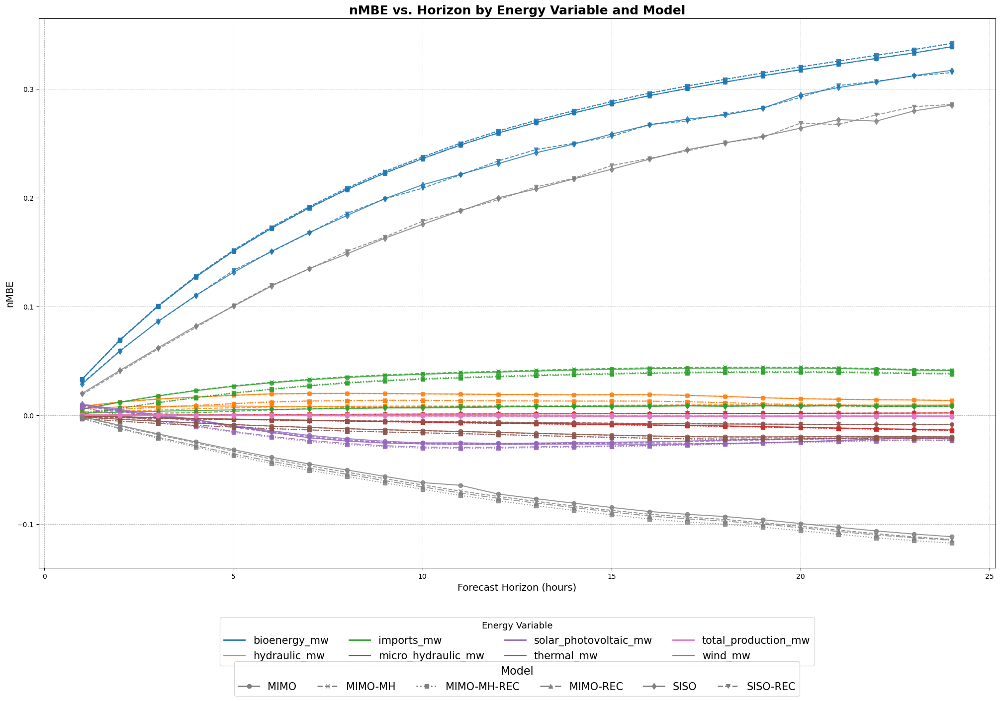

      - Plotting R2...
Figure saved: figures/model_comparison_r2_by_variable.png


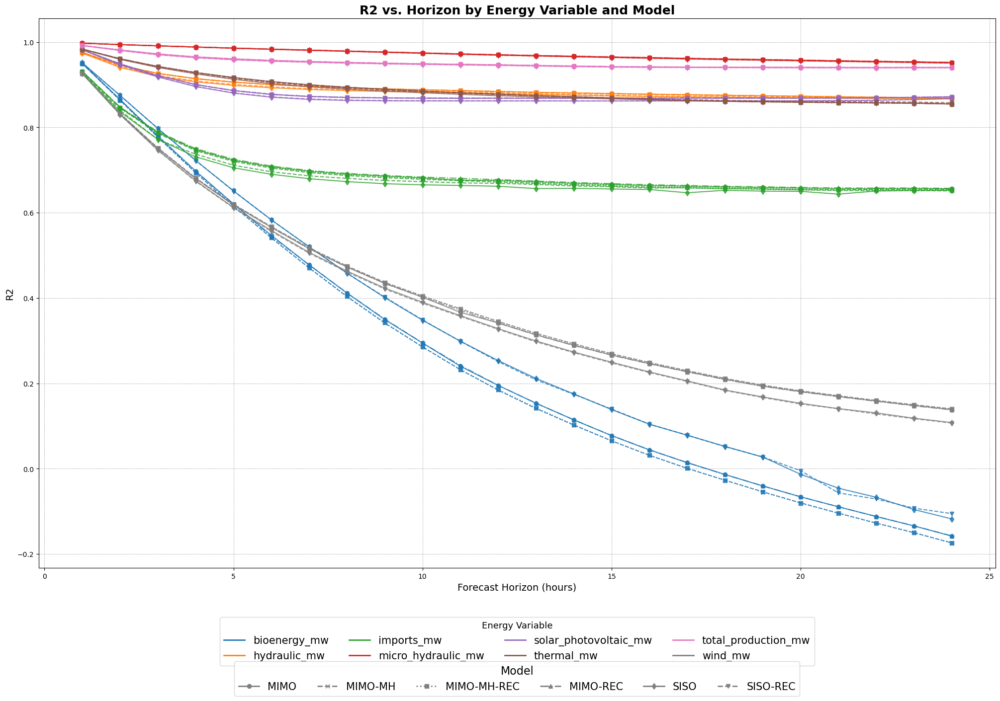

    - Generating Plot 4: Metrics by Energy Variable (Subplot View)...
      - Plotting nRMSE...
Figure saved: figures/nrmse_by_variable_subplots.png


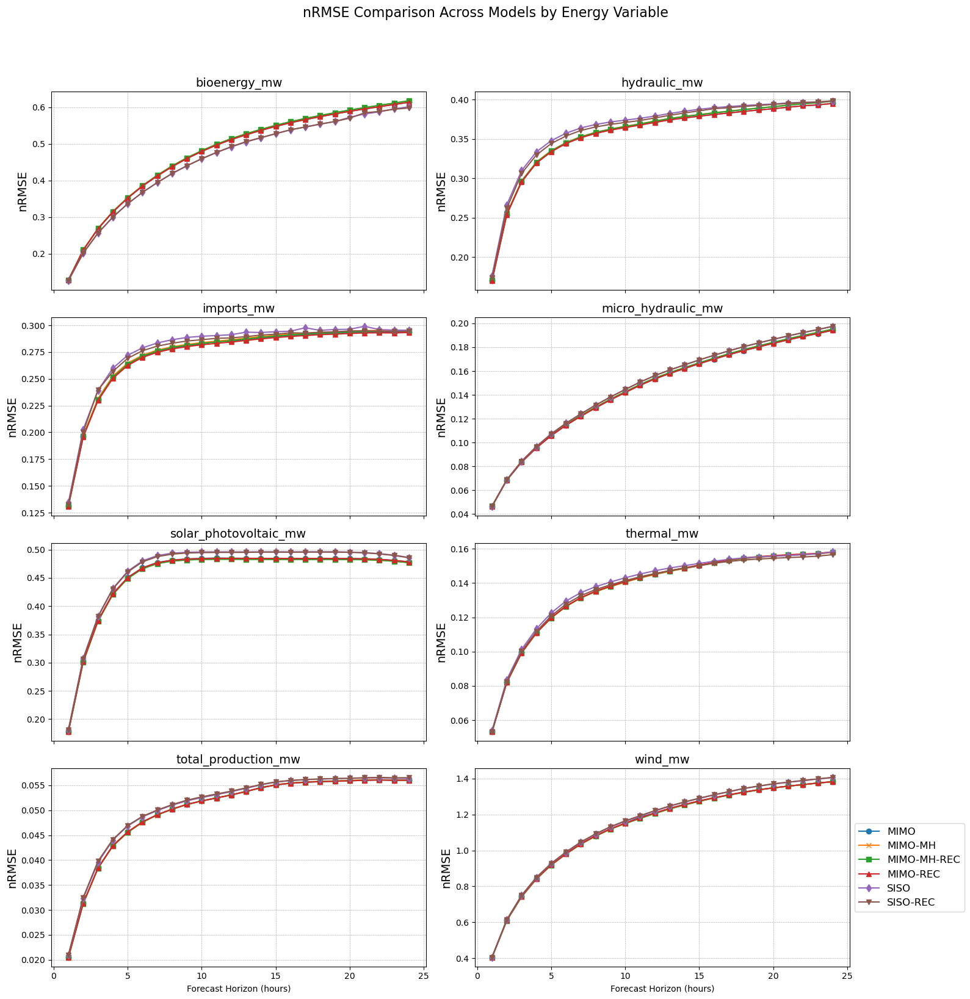

      - Plotting R2...
Figure saved: figures/r2_by_variable_subplots.png


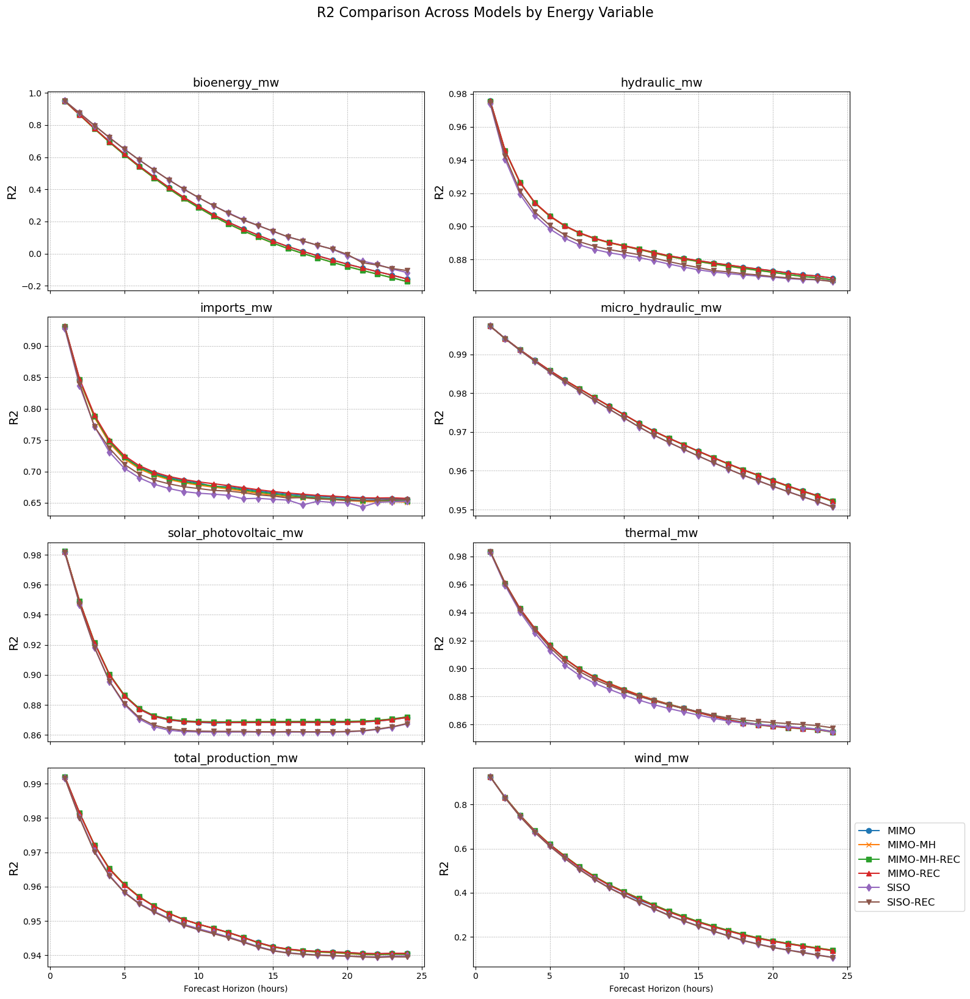

      - Plotting nMAE...
Figure saved: figures/nmae_by_variable_subplots.png


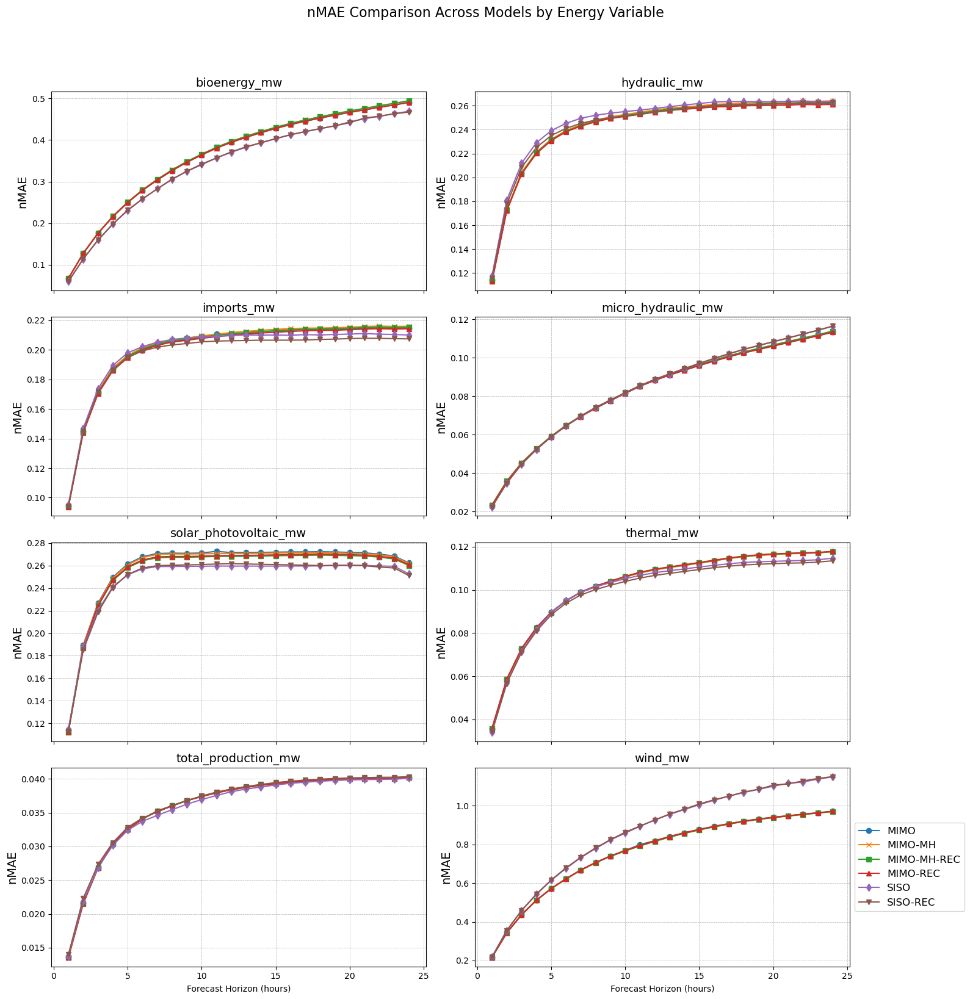

      - Plotting nMBE...
Figure saved: figures/nmbe_by_variable_subplots.png


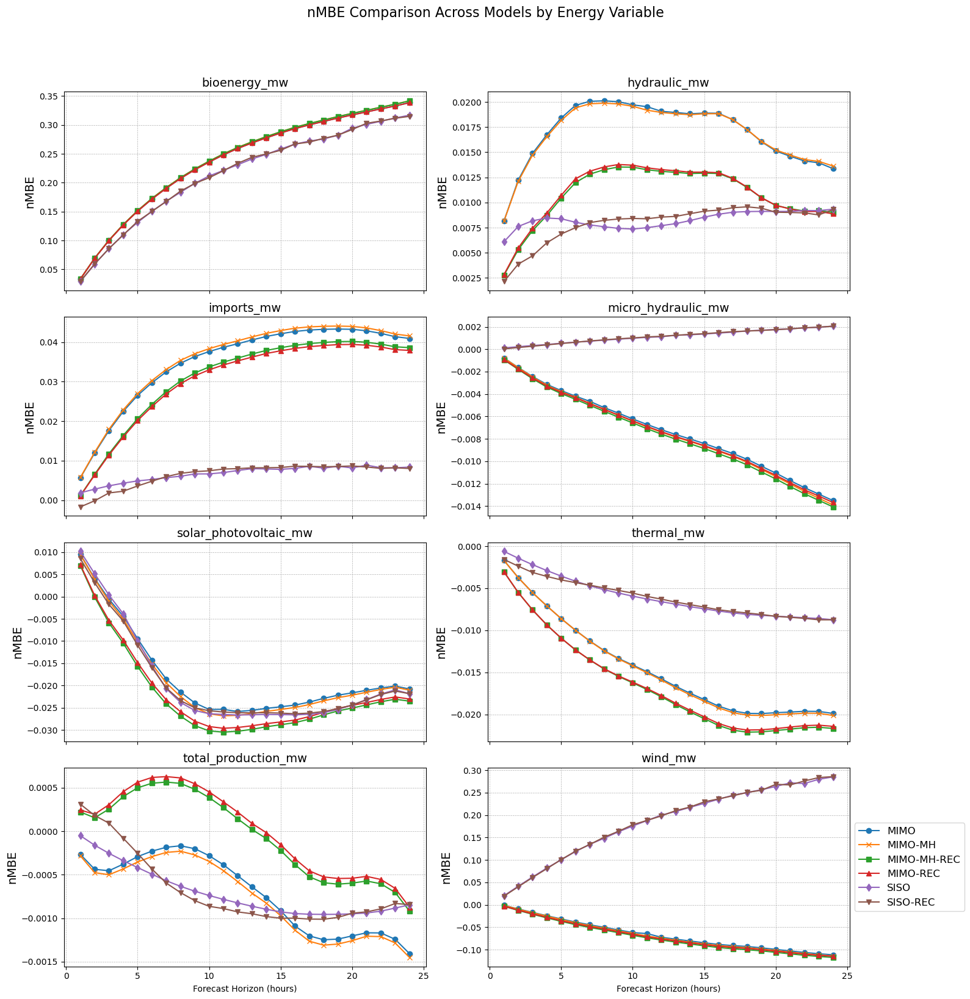

>>> Plot generation complete.

    - Generating Plot 5: Reconciliation Improvement (% in nRMSE)...
Figure saved: figures/reconciliation_improvement.png


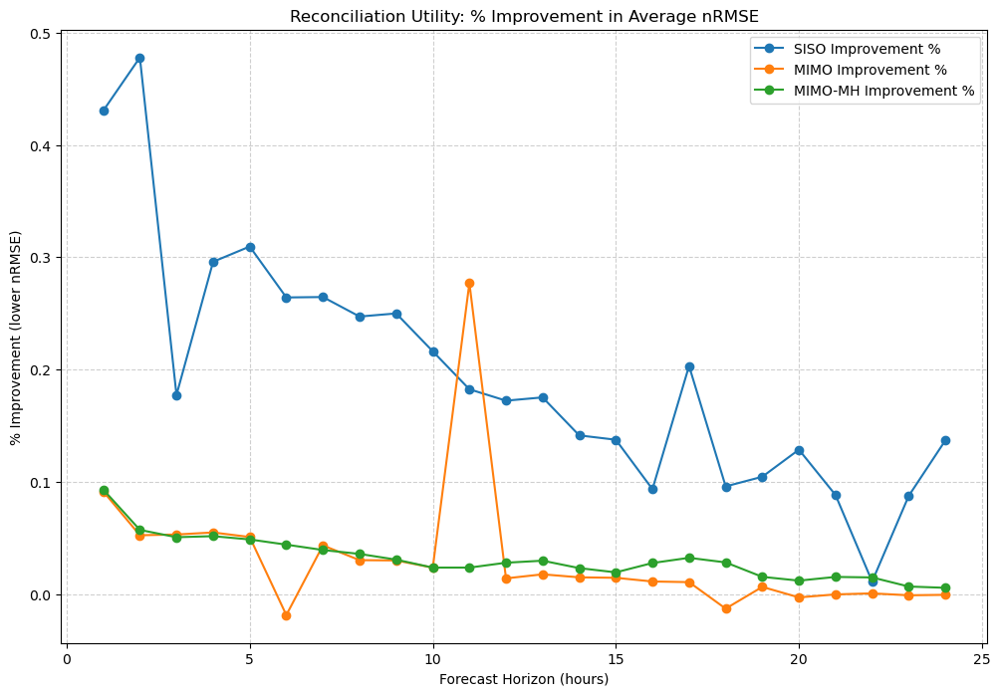

    - Generating Plot 6: Model Execution Times...


C:\Users\yoan\Downloads\STAGE\V3-Program_SISO_Prophet_Time_gpt_MIMO_MIMO-MH\plotting.py:421: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=45, ha='right')


Figure saved: figures/model_execution_times.png


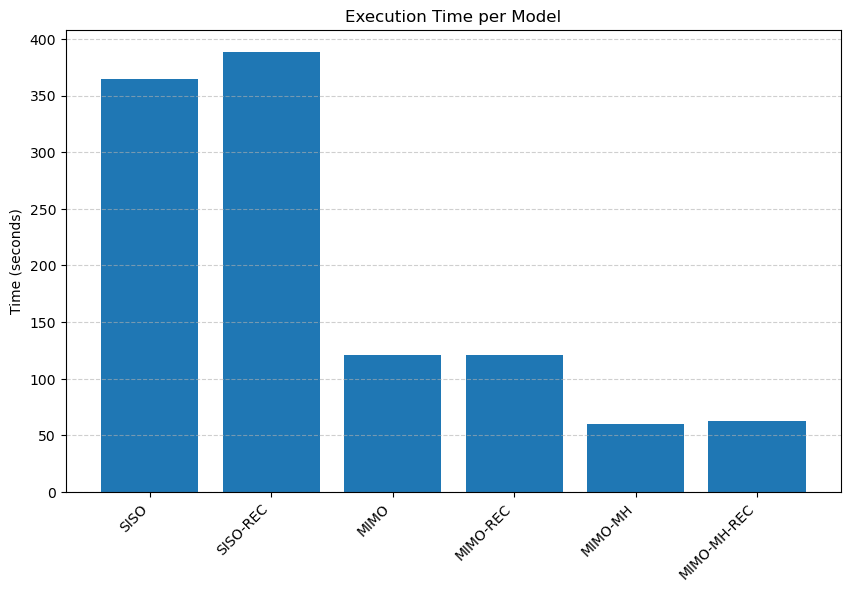

In [2]:
# (MIMO vs SISO vs MIMO-MH) Base + REC
main.main()

### (MIMO + SISO + MIMO-MH) REC + Prophet + TimeGPT - 2


MODEL SELECTION MENU
--- Individual Models ---
 1 : Run SISO
 2 : Run MIMO
 3 : Run MIMO-MH

--- Reconciled (REC) Models Only ---
 4 : Run SISO-REC
 5 : Run MIMO-REC
 6 : Run MIMO-MH-REC

--- Combined Models (Base + Reconciled) ---
 7 : Run SISO (Base + REC)
 8 : Run MIMO (Base + REC)
 9 : Run MIMO-MH (Base + REC)
 10 : Run ALL ELM models (Base + REC)

--- External Models & Groups ---
 11 : Run Prophet + TimeGPT
 12 : Run ALL models (ELM Base + External)
 13 : Run ALL models (ELM REC + External)

--- Custom ---
 14 : Custom model selection


Please enter your choice (1-14):  13
Do you want to include persistence models in plots? (y/n):  y



HYPERPARAMETER CONFIGURATION


Enter the split date (YYYY-MM-DD) [default: 2021-01-01] (press Enter to use default):  
Enter the regularization lambda for ELM (e.g., 1e-6) [default: 1e-06] (press Enter to use default):  0.1
Enter the number of hidden neurons for ELM [default: 1000] (press Enter to use default):  
Enter the number of initializations for ELM [default: 1] (press Enter to use default):  


Final configuration used:
  - Split date: 2021-01-01
  - Lambda: 0.1
  - Hidden neurons: 1000
  - Initializations: 1

>>> Loading and pre-processing data...
    - Duplicates aggregated by taking the mean.
    - Data loaded successfully: 61361 rows, 12 columns.
>>> Data loading complete.

>>> Running forecasting models...
    - Running SISO-REC model...
        - Applying reconciliation...
    - SISO-REC model finished.
    -> Execution time for SISO-REC: 351.65 seconds.
    - Running MIMO-REC model...
        - Applying reconciliation...
    - MIMO-REC model finished.
    -> Execution time for MIMO-REC: 115.90 seconds.
    - Running MIMO-MH-REC model...
        - Applying reconciliation...
        - Coherence Error |Total - sum(children)|: Raw=1.1333 -> Reconciled=0.0000
    - MIMO-MH-REC model finished.
    -> Execution time for MIMO-MH-REC: 58.40 seconds.
>>> Forecasting models finished.

>>> Computing performance metrics...
    - Metrics computed for 576 combinations.
>>> Metrics co

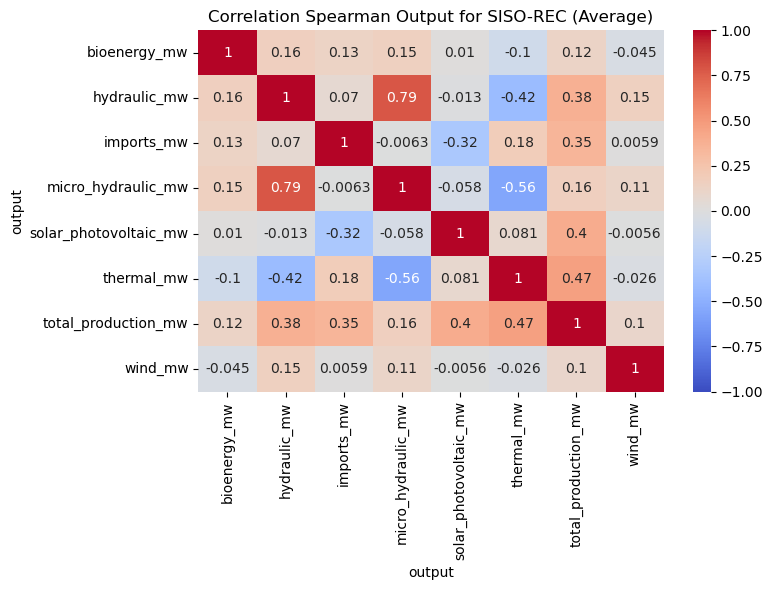

Figure saved: figures/correlation_spearman_output_MIMO-REC.png


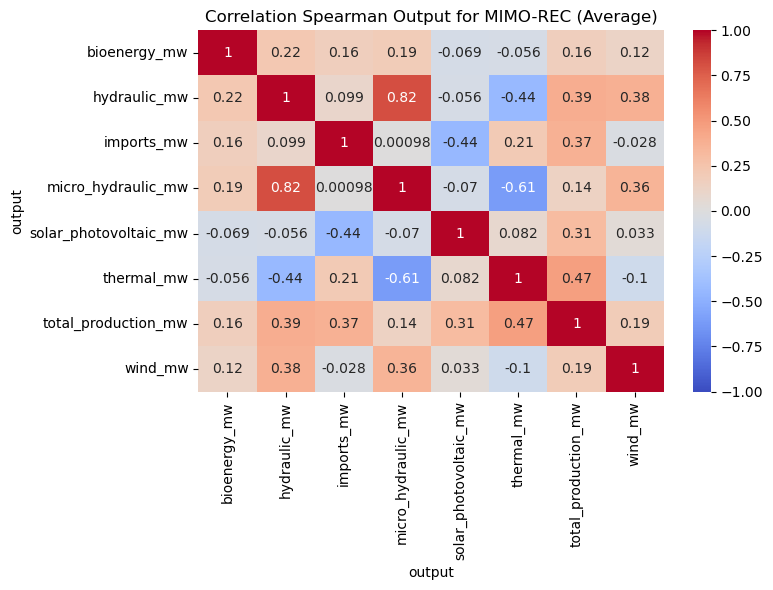

Figure saved: figures/correlation_spearman_output_MIMO-MH-REC.png


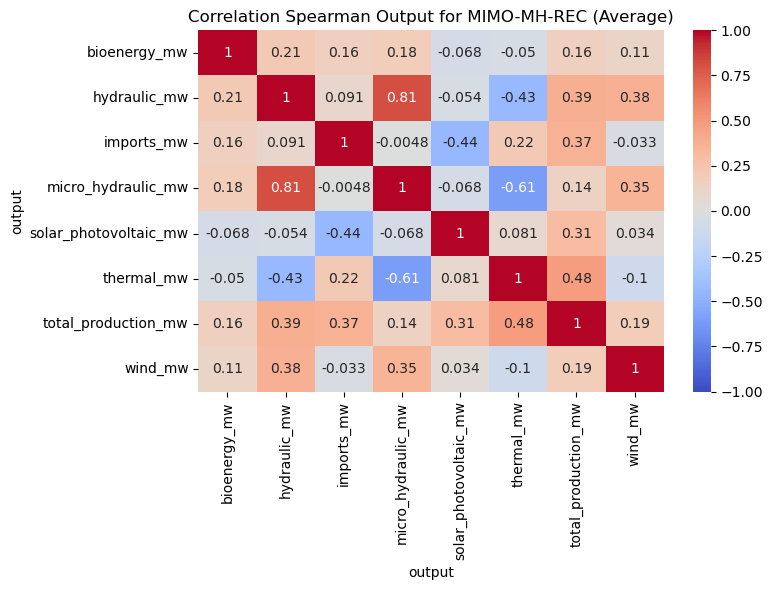

Figure saved: figures/correlation_spearman_horizon_SISO-REC.png


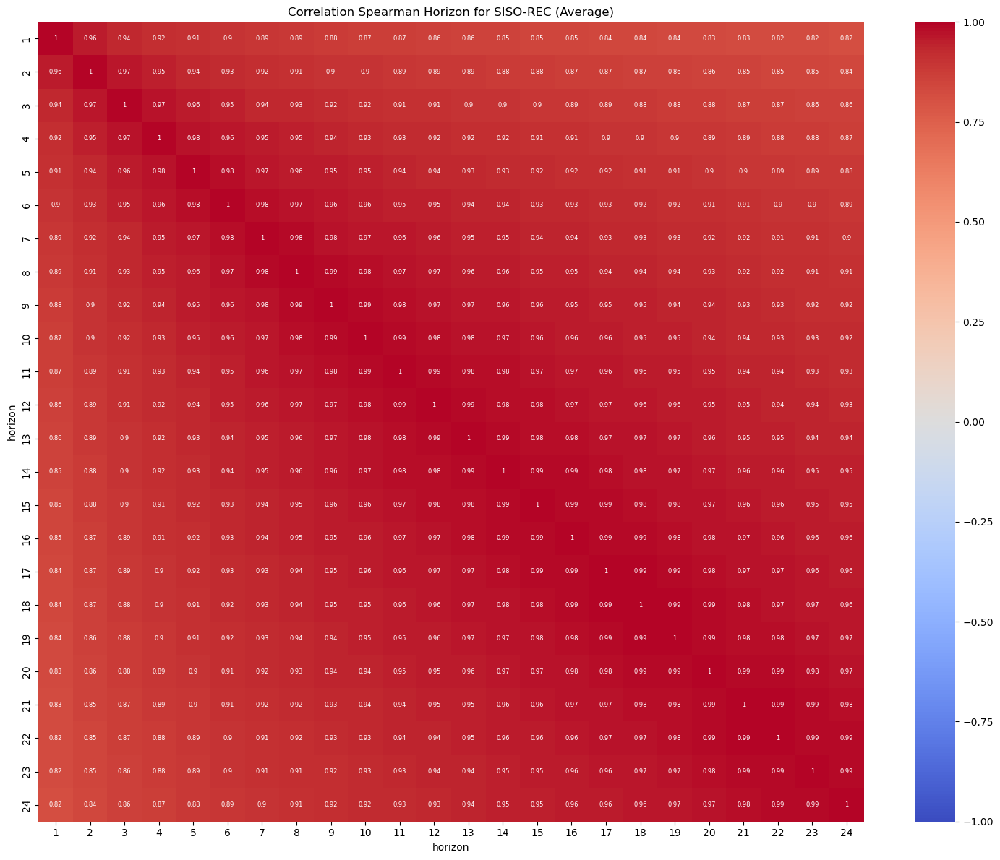

Figure saved: figures/correlation_spearman_horizon_MIMO-REC.png


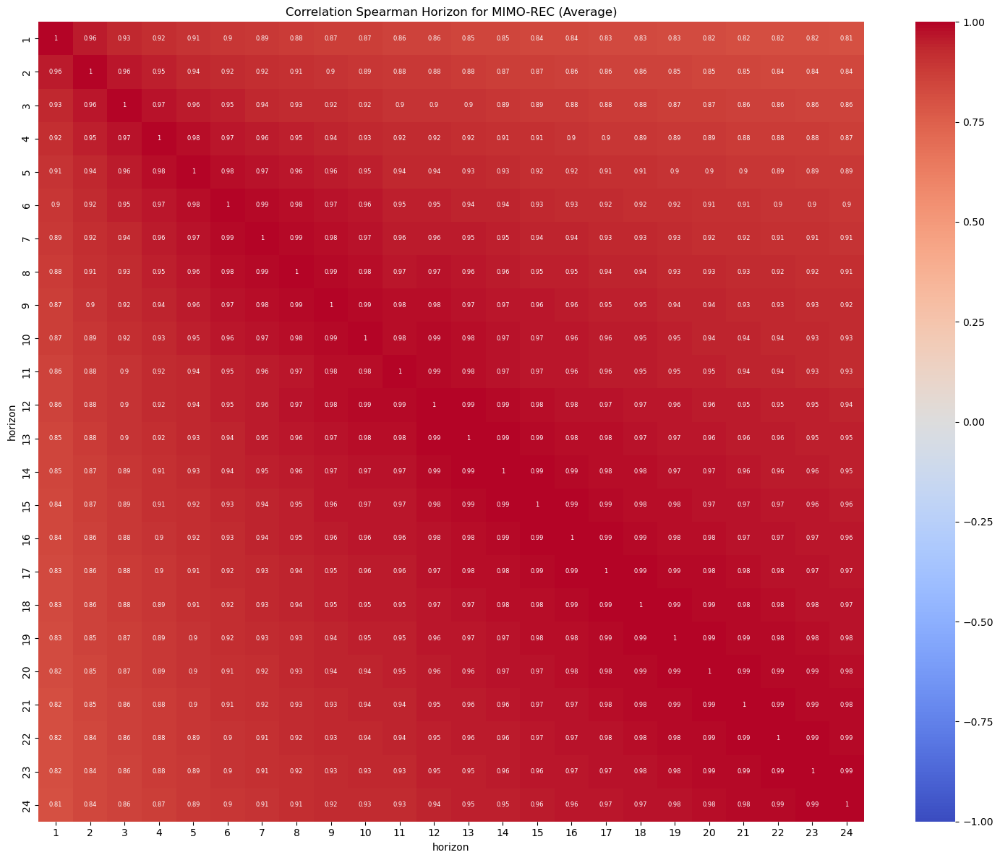

Figure saved: figures/correlation_spearman_horizon_MIMO-MH-REC.png


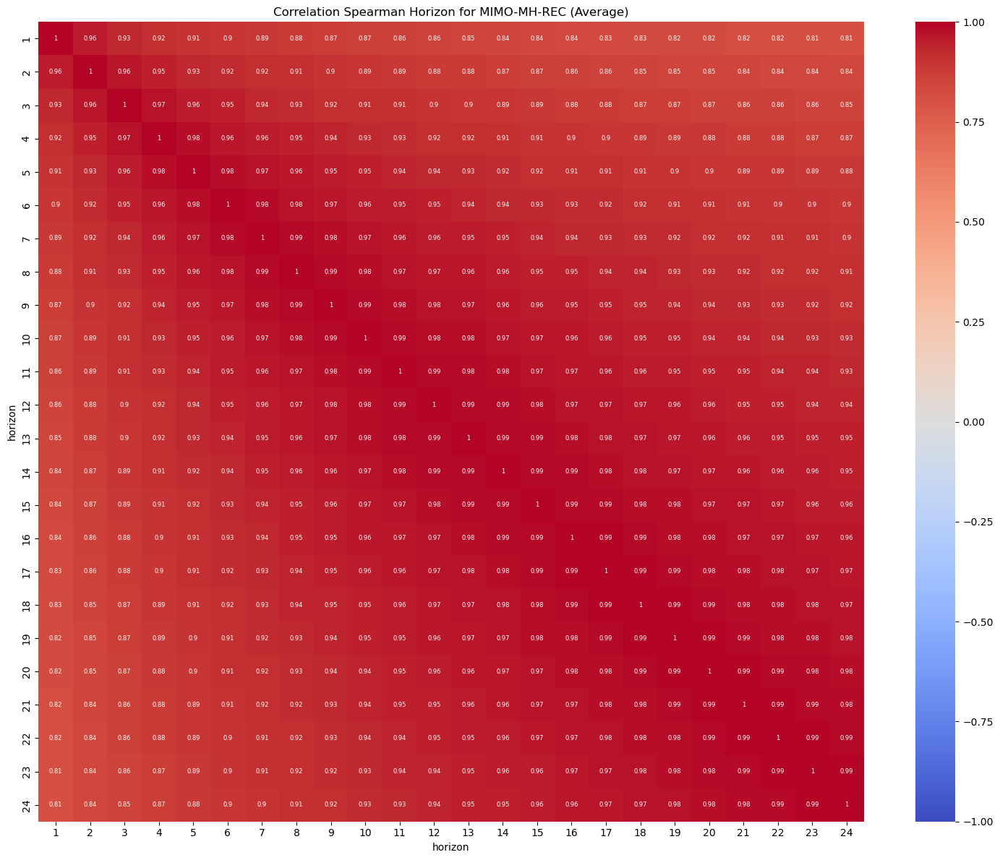

Figure saved: figures/pacf_solar_photovoltaic.png


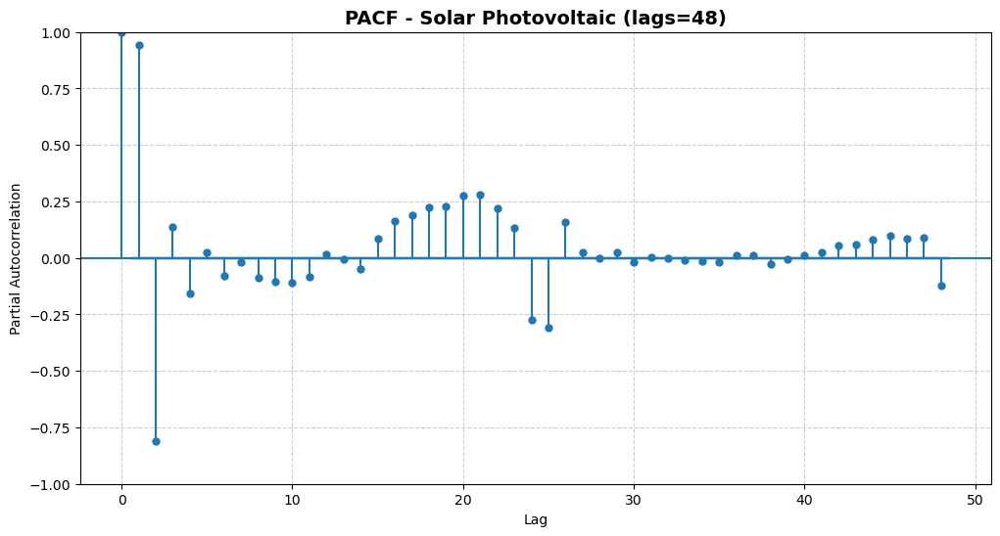

    - All model metrics have been combined.
>>>  External models processed.

    - Final metrics saved to 'final_metrics_comparison.csv'

>>> Final Metrics Comparison:
          model  horizon                output    nRMSE     nMAE          nMBE           R2      RMSE       MAE           MBE
    MIMO-MH-REC        1          bioenergy_mw 0.128158 0.067952  3.341788e-02     0.949197  0.049202  0.026088  1.282970e-02
       MIMO-REC        1          bioenergy_mw 0.127509 0.067279  3.317107e-02     0.950009  0.049027  0.025869  1.275425e-02
Persistence_24h        1          bioenergy_mw 0.570910 0.308948  9.282496e-19    -0.002998  0.218906  0.118461  3.559222e-19
  Persistence_h        1          bioenergy_mw 0.120824 0.027286 -3.315177e-20     0.955077  0.046328  0.010463 -1.271151e-20
        Prophet        1          bioenergy_mw 0.124327 0.064505  3.702395e-02     0.952211  0.047868  0.024835  1.425470e-02
       SISO-REC        1          bioenergy_mw 0.125558 0.059771  2.888051e-

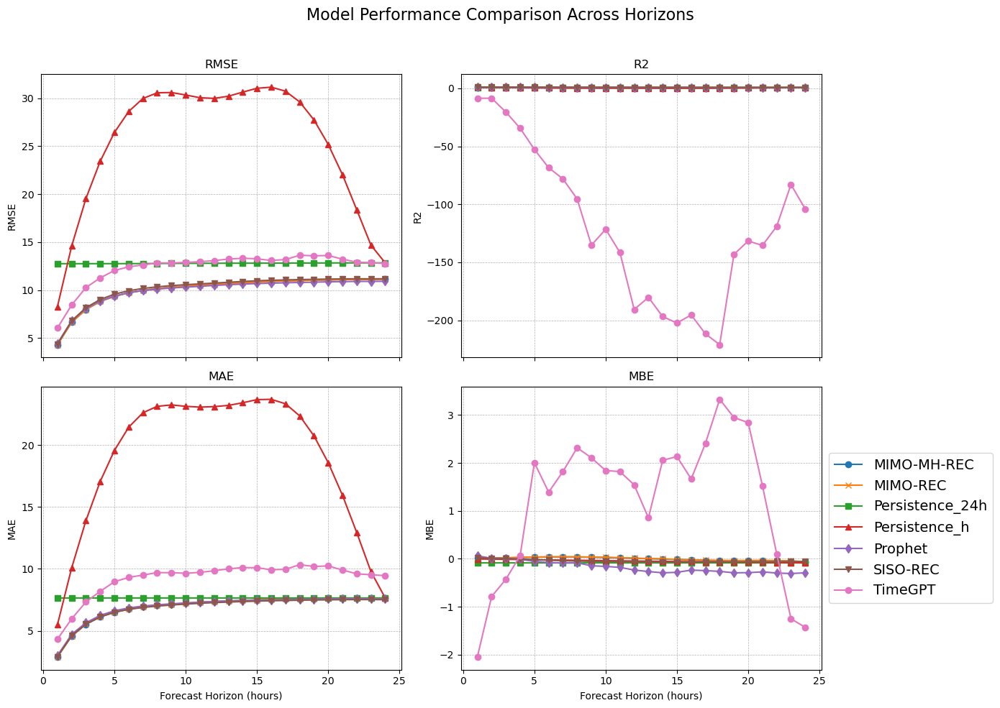

    - Generating Plot 2: Normalized Key Metrics Subplots (nRMSE, R2, nMAE, nMBE)...
Figure saved: figures/model_comparison_normalized_metrics.png


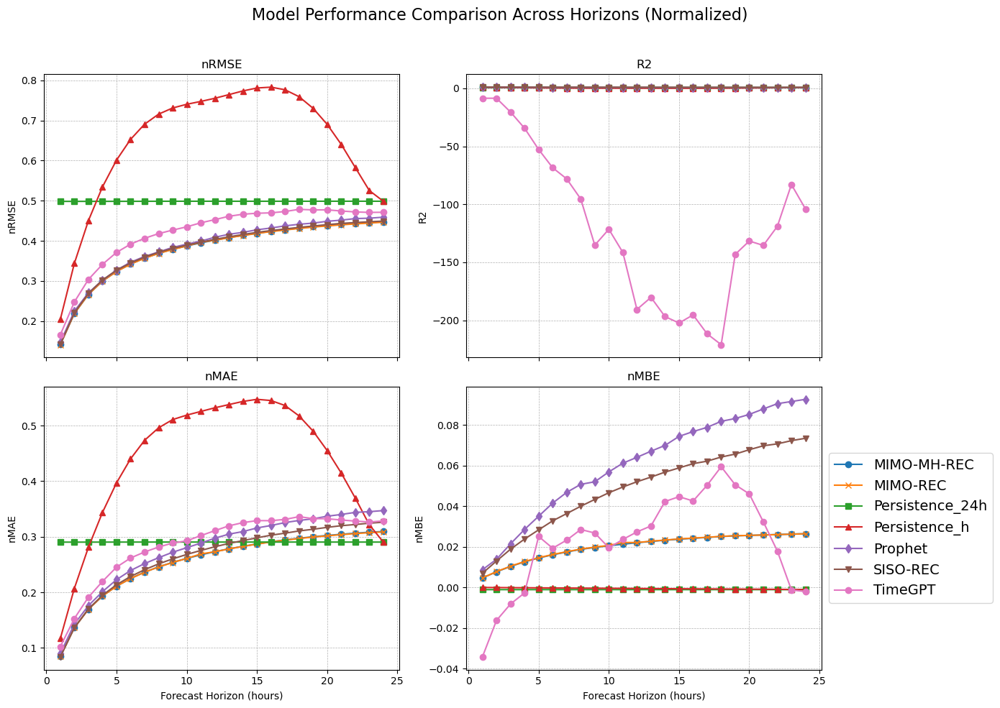

    - Generating Plot 3: Metrics by Energy Variable (Combined View)...
      - Plotting nRMSE...
Figure saved: figures/model_comparison_nrmse_by_variable.png


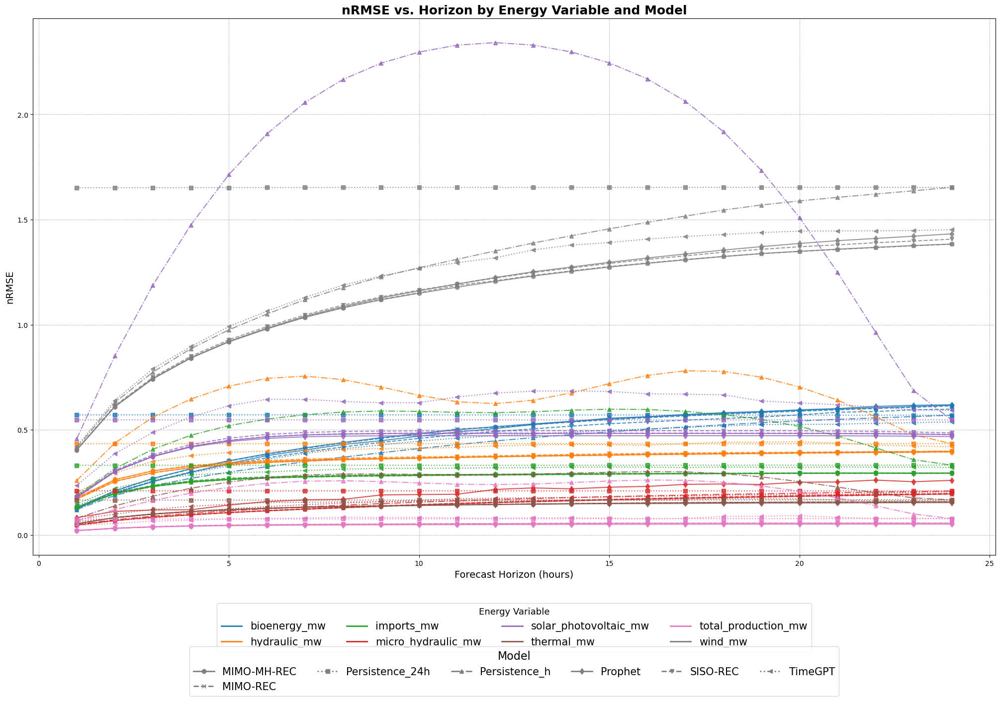

      - Plotting nMAE...
Figure saved: figures/model_comparison_nmae_by_variable.png


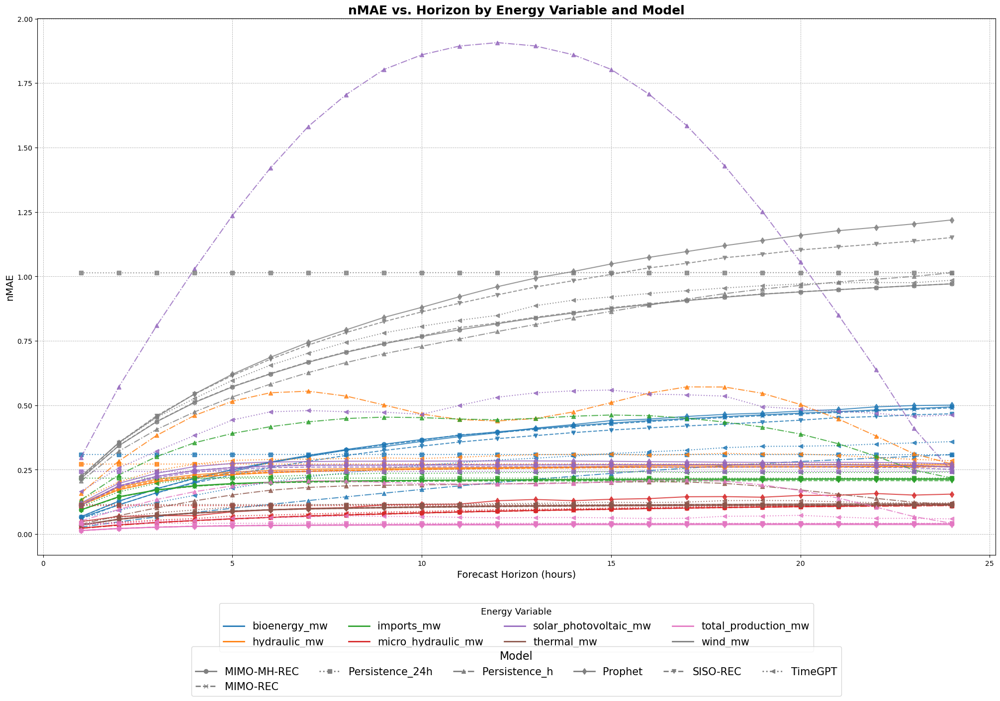

      - Plotting nMBE...
Figure saved: figures/model_comparison_nmbe_by_variable.png


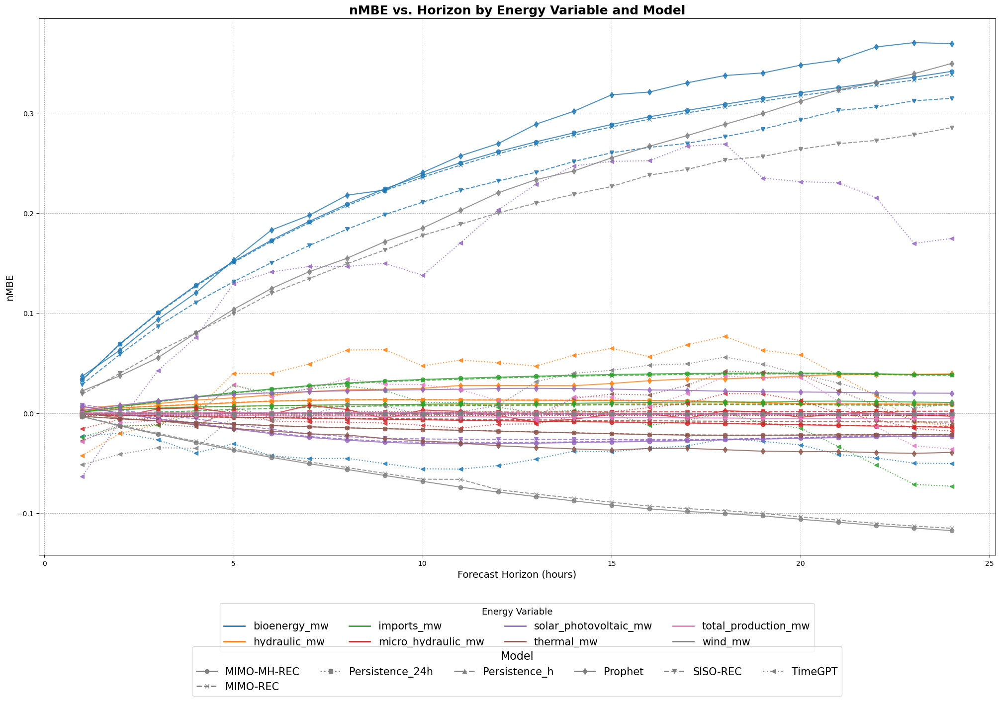

      - Plotting R2...
Figure saved: figures/model_comparison_r2_by_variable.png


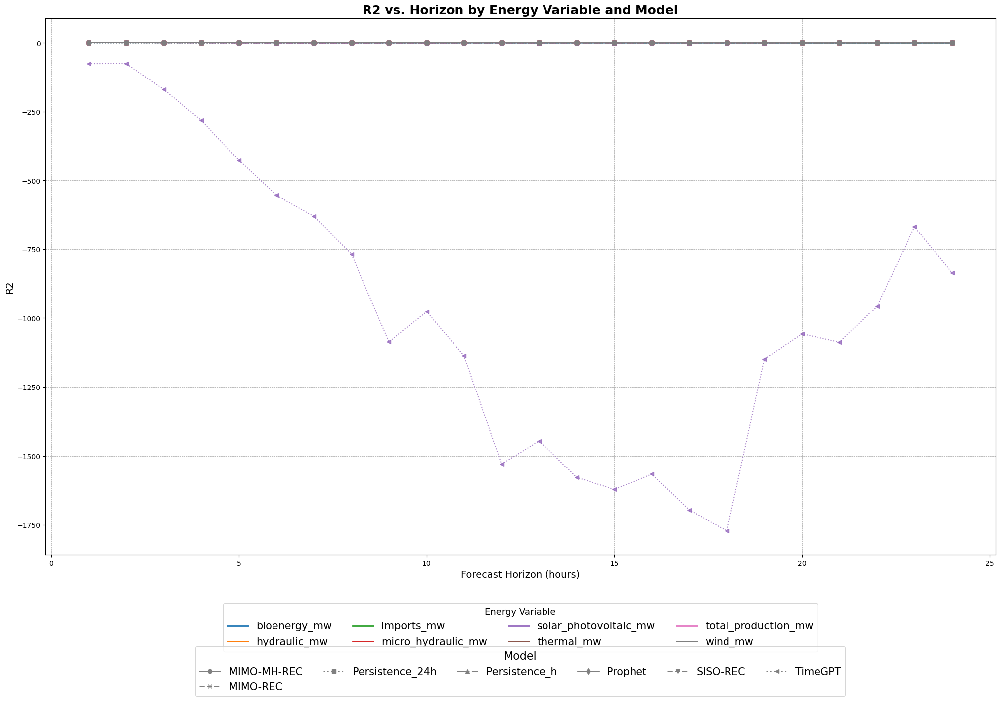

    - Generating Plot 4: Metrics by Energy Variable (Subplot View)...
      - Plotting nRMSE...
Figure saved: figures/nrmse_by_variable_subplots.png


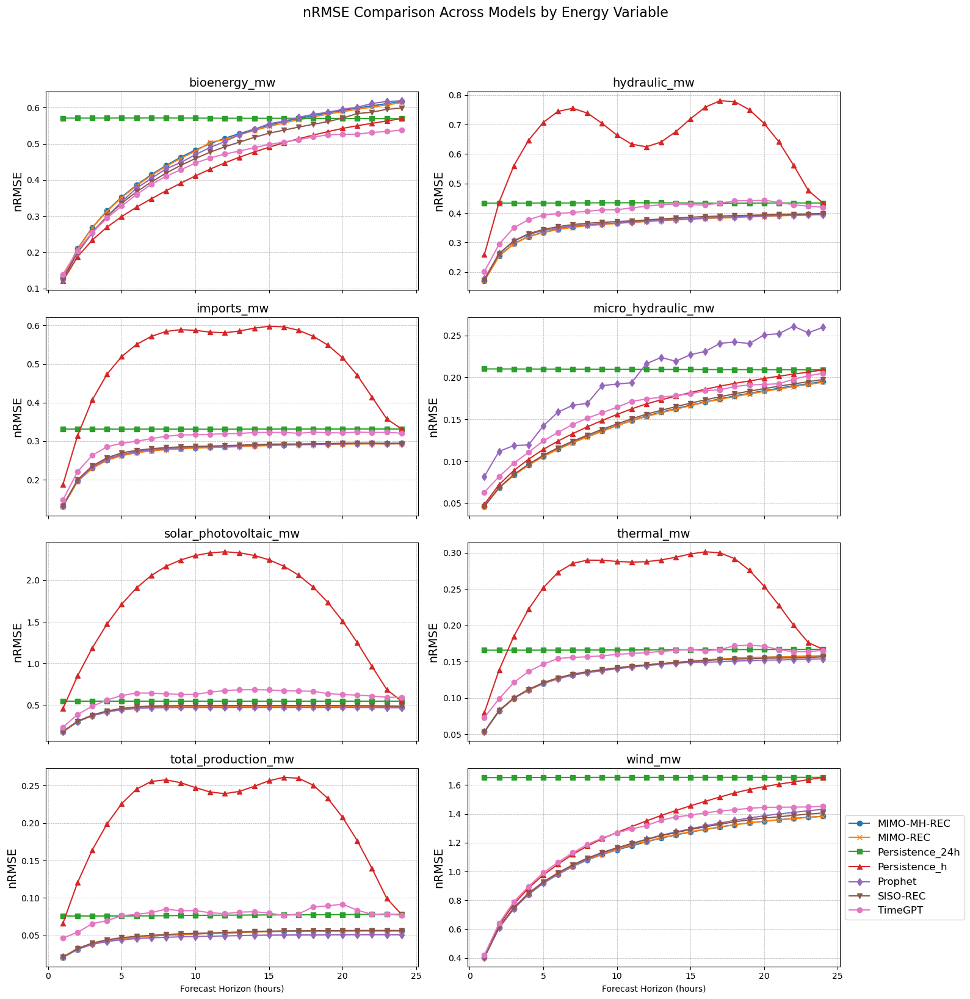

      - Plotting R2...
Figure saved: figures/r2_by_variable_subplots.png


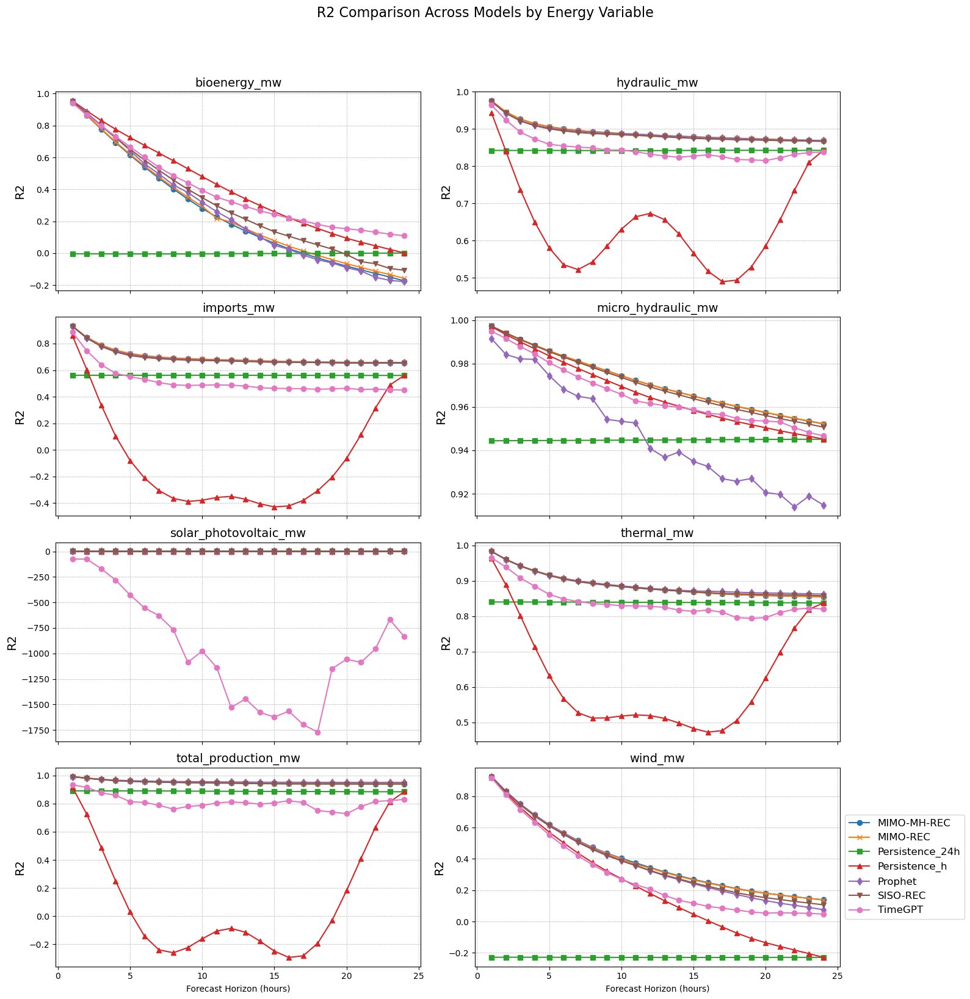

      - Plotting nMAE...
Figure saved: figures/nmae_by_variable_subplots.png


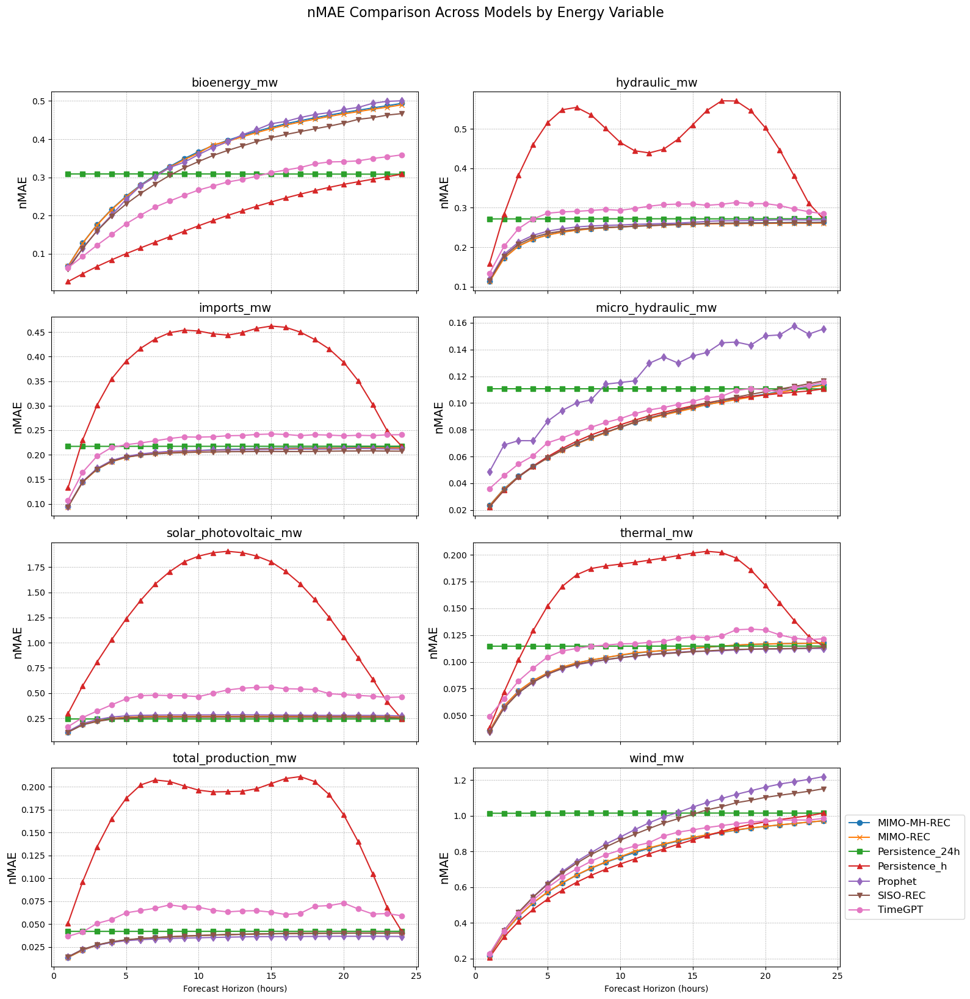

      - Plotting nMBE...
Figure saved: figures/nmbe_by_variable_subplots.png


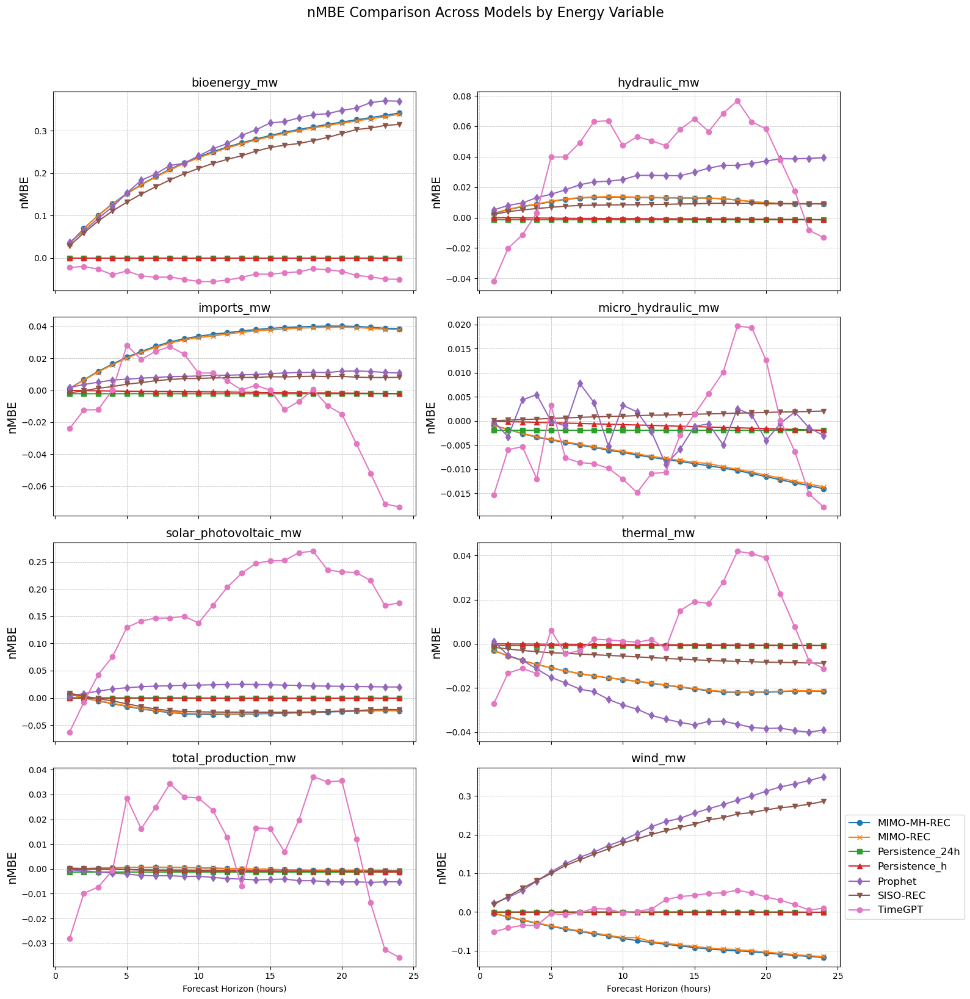

>>> Plot generation complete.

    - Generating Plot 5: Reconciliation Improvement (% in nRMSE)...
Figure saved: figures/reconciliation_improvement.png


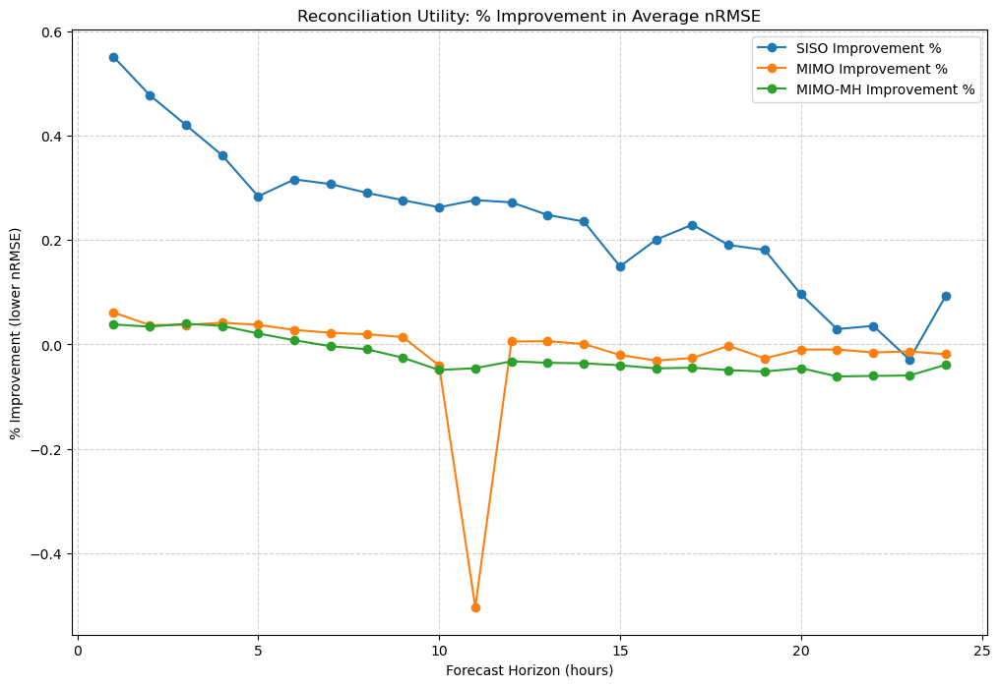

    - Generating Plot 6: Model Execution Times...


C:\Users\yoan\Downloads\STAGE\V3-Program_SISO_Prophet_Time_gpt_MIMO_MIMO-MH\plotting.py:421: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=45, ha='right')


Figure saved: figures/model_execution_times.png


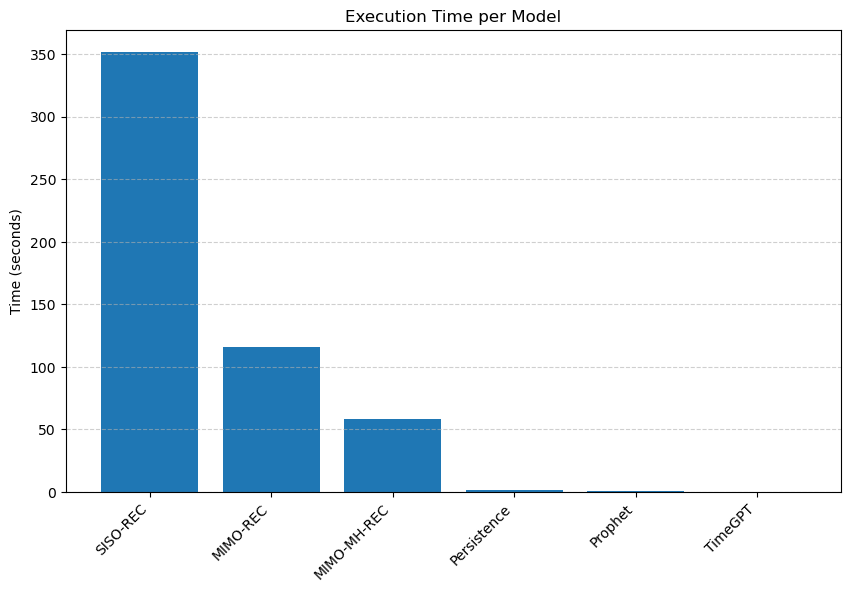

In [2]:
main.main()


MODEL SELECTION MENU
--- Individual Models ---
 1 : Run SISO
 2 : Run MIMO
 3 : Run MIMO-MH

--- Reconciled (REC) Models Only ---
 4 : Run SISO-REC
 5 : Run MIMO-REC
 6 : Run MIMO-MH-REC

--- Combined Models (Base + Reconciled) ---
 7 : Run SISO (Base + REC)
 8 : Run MIMO (Base + REC)
 9 : Run MIMO-MH (Base + REC)
 10 : Run ALL ELM models (Base + REC)

--- External Models & Groups ---
 11 : Run Prophet + TimeGPT
 12 : Run ALL models (ELM Base + External)
 13 : Run ALL models (ELM REC + External)

--- Custom ---
 14 : Custom model selection


Please enter your choice (1-14):  13
Do you want to include persistence models in plots? (y/n):  n



HYPERPARAMETER CONFIGURATION


Enter the split date (YYYY-MM-DD) [default: 2021-01-01] (press Enter to use default):  
Enter the regularization lambda for ELM (e.g., 1e-6) [default: 1e-06] (press Enter to use default):  0.1
Enter the number of hidden neurons for ELM [default: 1000] (press Enter to use default):  
Enter the number of initializations for ELM [default: 1] (press Enter to use default):  


Final configuration used:
  - Split date: 2021-01-01
  - Lambda: 0.1
  - Hidden neurons: 1000
  - Initializations: 1

>>> Loading and pre-processing data...
    - Duplicates aggregated by taking the mean.
    - Data loaded successfully: 61361 rows, 12 columns.
>>> Data loading complete.

>>> Running forecasting models...
    - Running SISO-REC model...
        - Applying reconciliation...
    - SISO-REC model finished.
    -> Execution time for SISO-REC: 348.41 seconds.
    - Running MIMO-REC model...
        - Applying reconciliation...
    - MIMO-REC model finished.
    -> Execution time for MIMO-REC: 113.97 seconds.
    - Running MIMO-MH-REC model...
        - Applying reconciliation...
        - Coherence Error |Total - sum(children)|: Raw=1.1283 -> Reconciled=0.0000
    - MIMO-MH-REC model finished.
    -> Execution time for MIMO-MH-REC: 60.66 seconds.
>>> Forecasting models finished.

>>> Computing performance metrics...
    - Metrics computed for 576 combinations.
>>> Metrics co

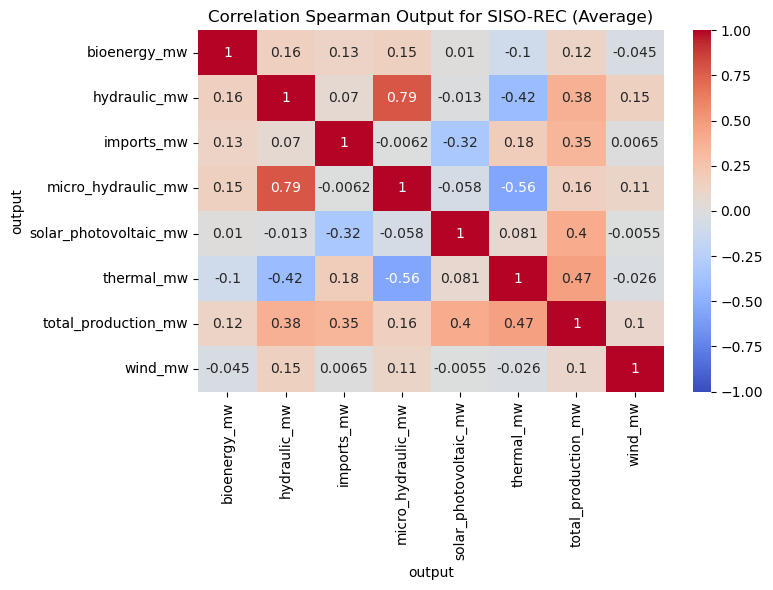

Figure saved: figures/correlation_spearman_output_MIMO-REC.png


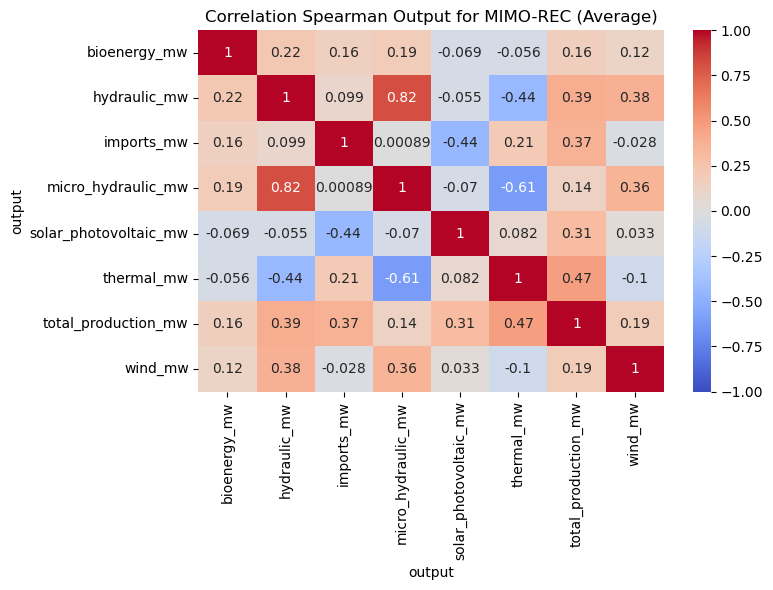

Figure saved: figures/correlation_spearman_output_MIMO-MH-REC.png


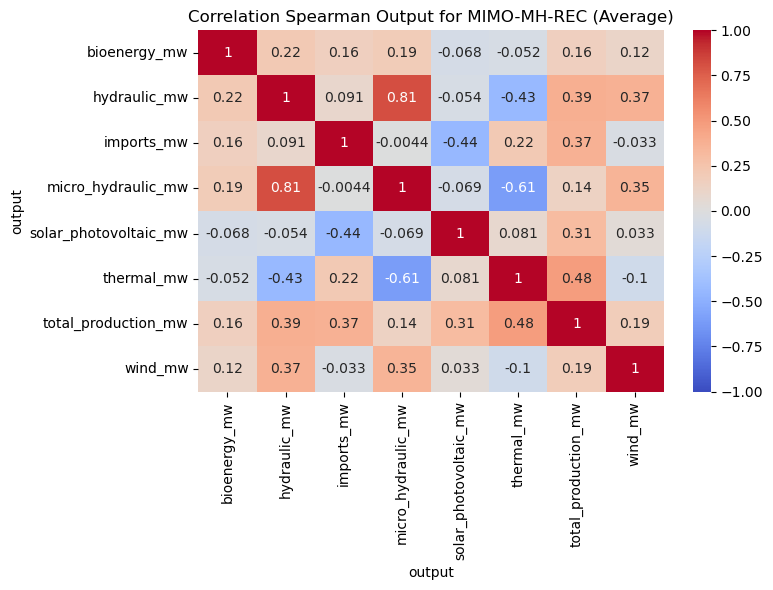

Figure saved: figures/correlation_spearman_horizon_SISO-REC.png


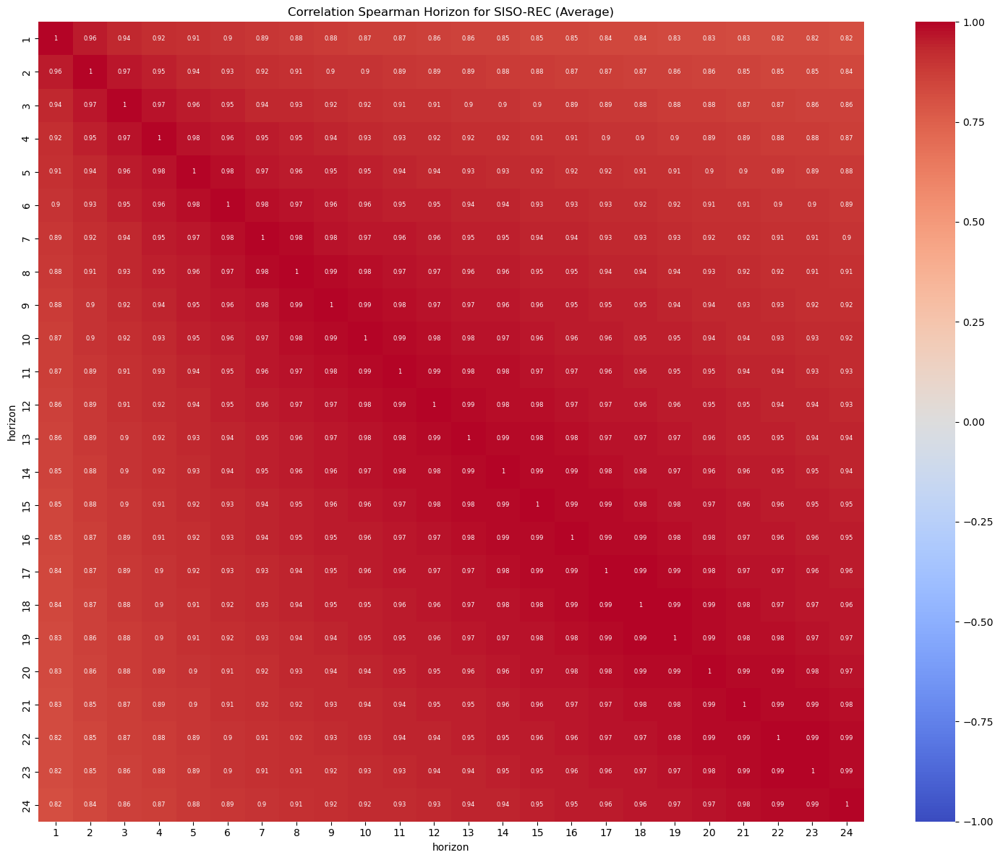

Figure saved: figures/correlation_spearman_horizon_MIMO-REC.png


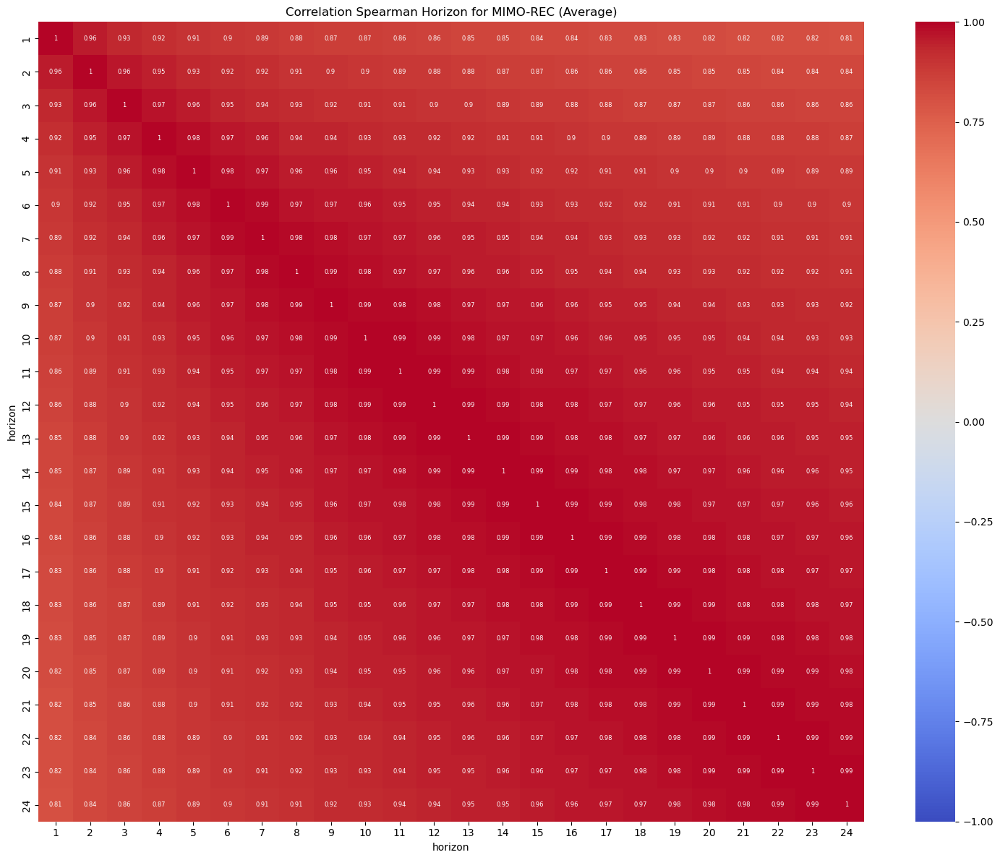

Figure saved: figures/correlation_spearman_horizon_MIMO-MH-REC.png


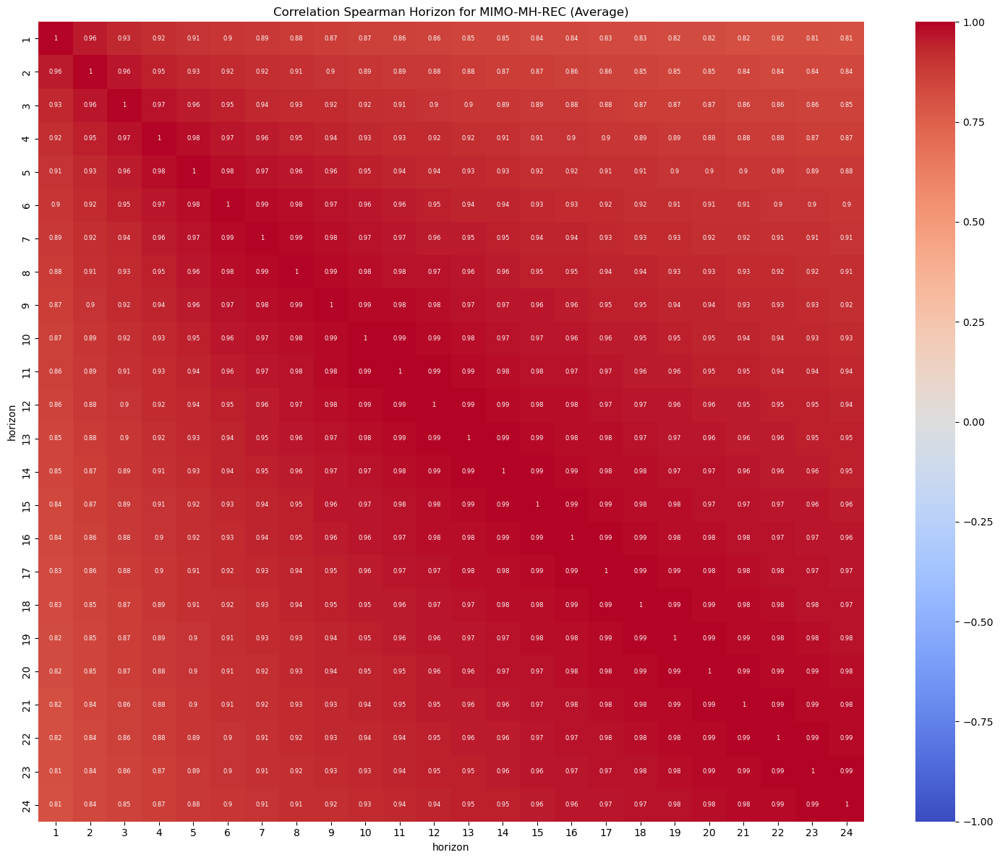

Figure saved: figures/pacf_solar_photovoltaic.png


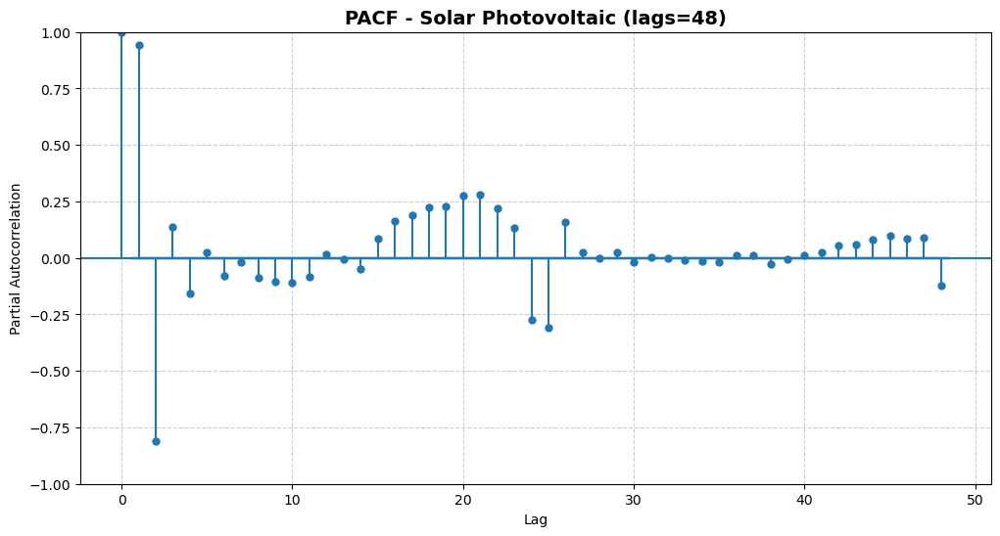

    - All model metrics have been combined.
>>>  External models processed.

    - Final metrics saved to 'final_metrics_comparison.csv'

>>> Final Metrics Comparison:
      model  horizon                output    nRMSE     nMAE      nMBE           R2      RMSE       MAE       MBE
MIMO-MH-REC        1          bioenergy_mw 0.127932 0.067526  0.033298     0.949376  0.049115  0.025924  0.012784
   MIMO-REC        1          bioenergy_mw 0.127462 0.067232  0.033136     0.950046  0.049009  0.025851  0.012741
    Prophet        1          bioenergy_mw 0.124327 0.064505  0.037024     0.952211  0.047868  0.024835  0.014255
   SISO-REC        1          bioenergy_mw 0.125606 0.059775  0.028954     0.951229  0.048359  0.023013  0.011148
    TimeGPT        1          bioenergy_mw 0.139008 0.063619 -0.022728     0.940161  0.053756  0.024602 -0.008789
MIMO-MH-REC        2          bioenergy_mw 0.210079 0.127796  0.069382     0.863519  0.080643  0.049057  0.026634
   MIMO-REC        2          bioe

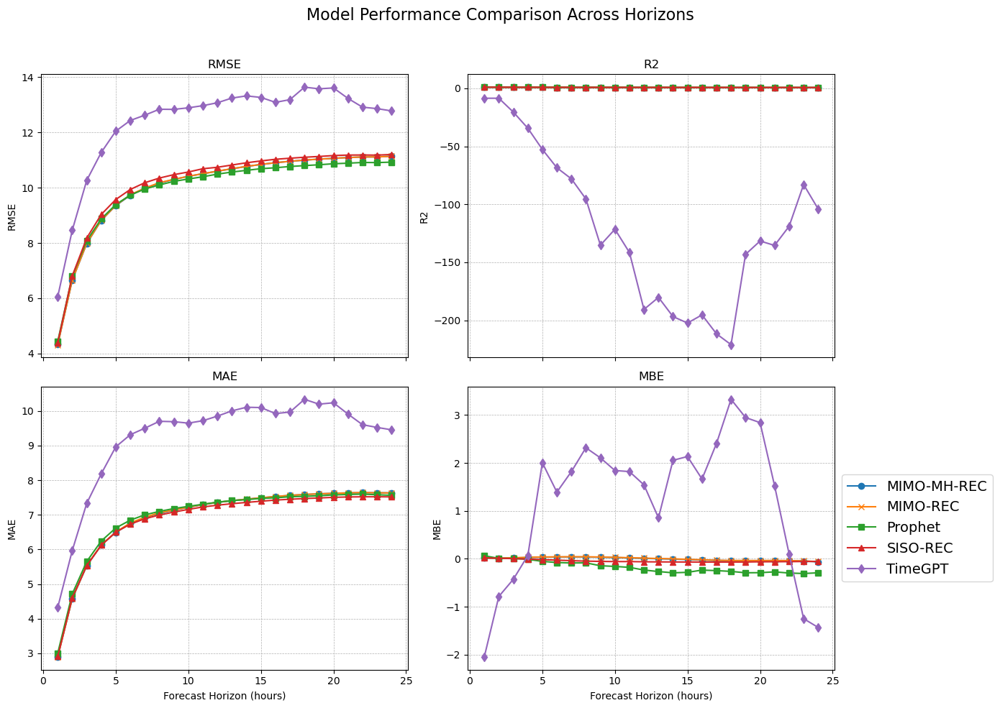

    - Generating Plot 2: Normalized Key Metrics Subplots (nRMSE, R2, nMAE, nMBE)...
Figure saved: figures/model_comparison_normalized_metrics.png


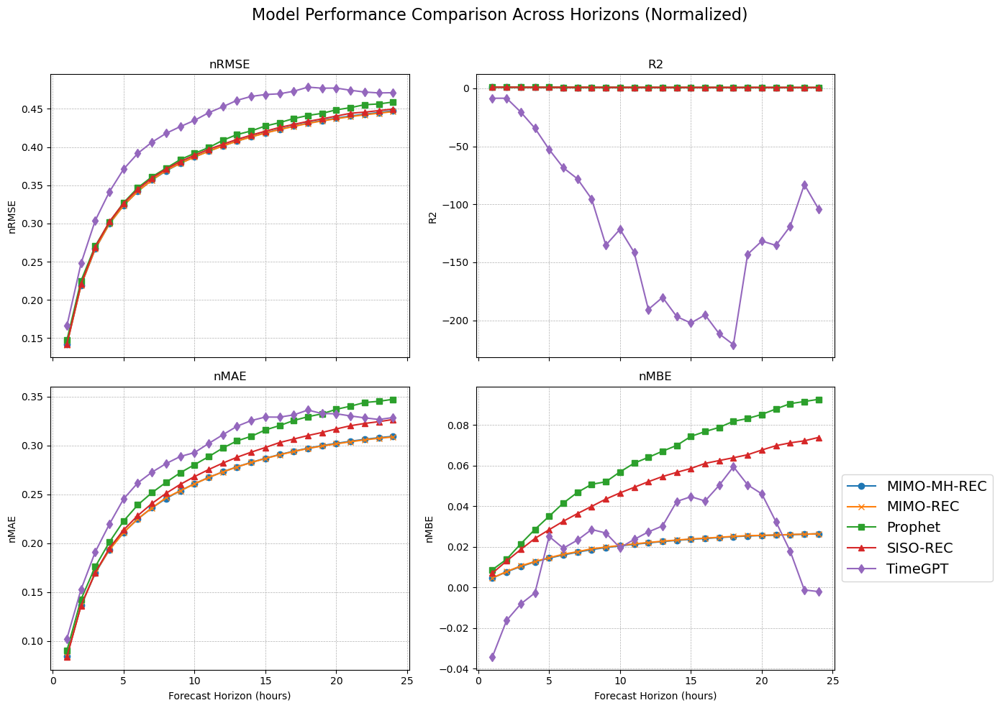

    - Generating Plot 3: Metrics by Energy Variable (Combined View)...
      - Plotting nRMSE...
Figure saved: figures/model_comparison_nrmse_by_variable.png


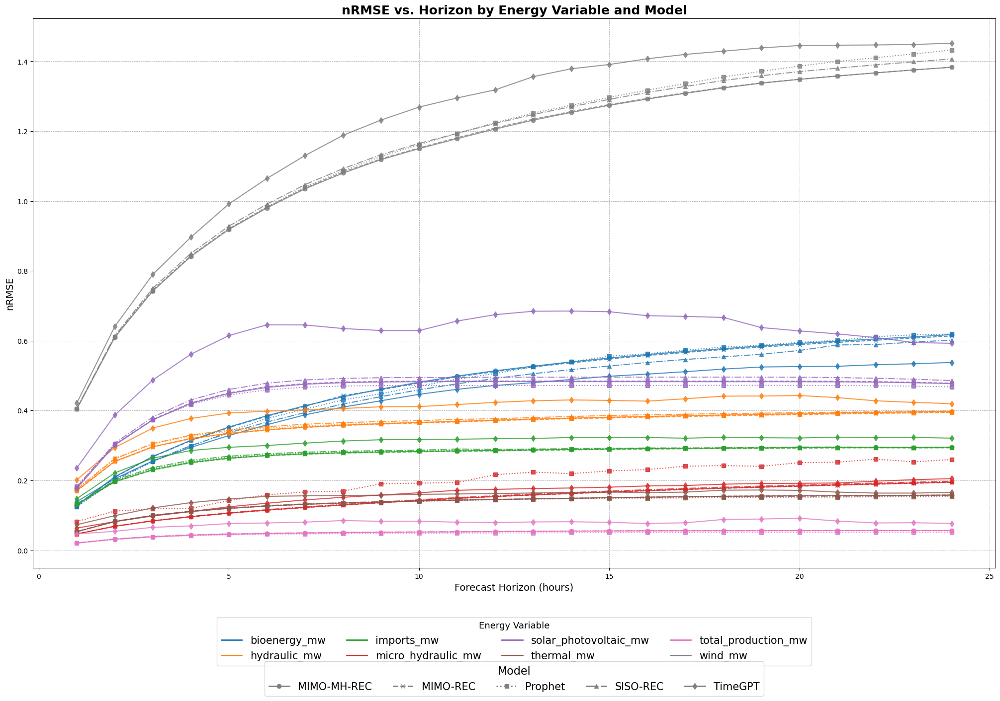

      - Plotting nMAE...
Figure saved: figures/model_comparison_nmae_by_variable.png


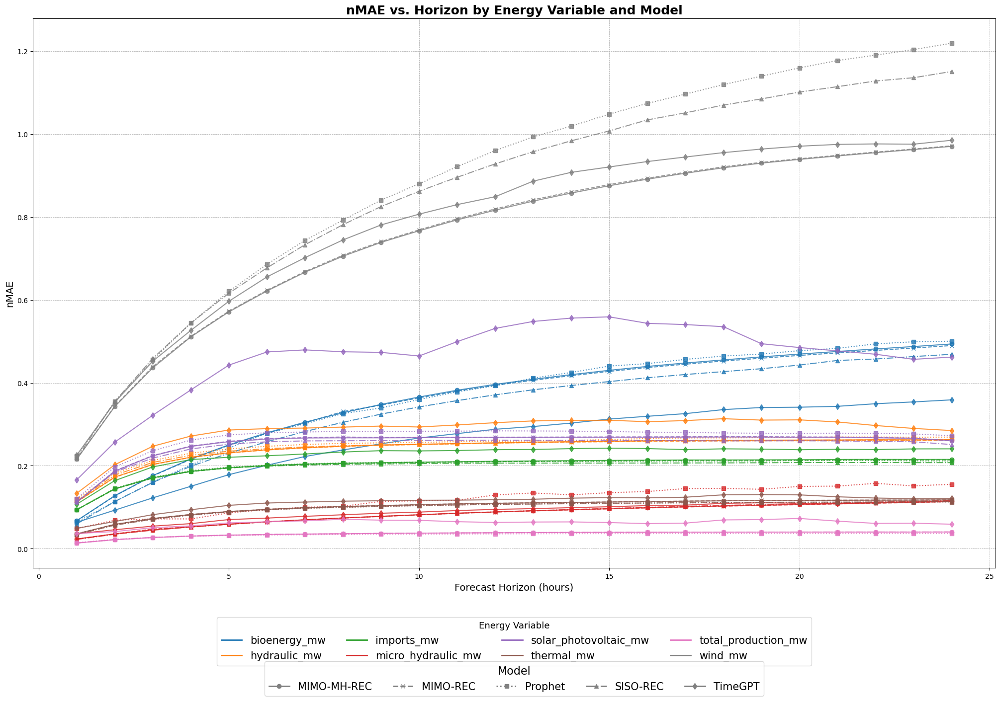

      - Plotting nMBE...
Figure saved: figures/model_comparison_nmbe_by_variable.png


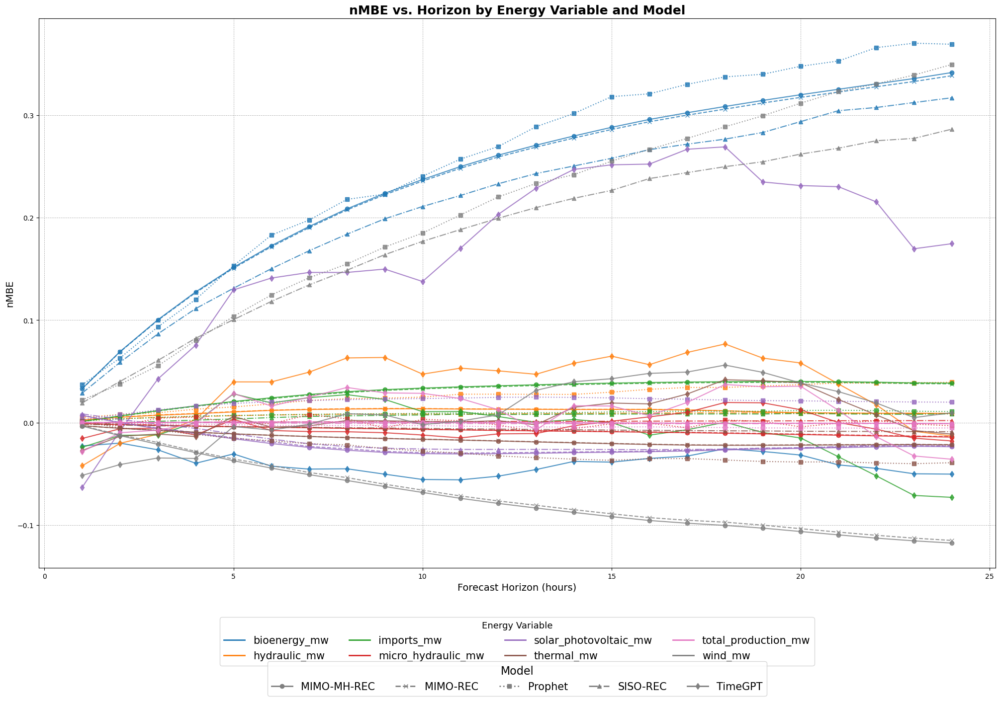

      - Plotting R2...
Figure saved: figures/model_comparison_r2_by_variable.png


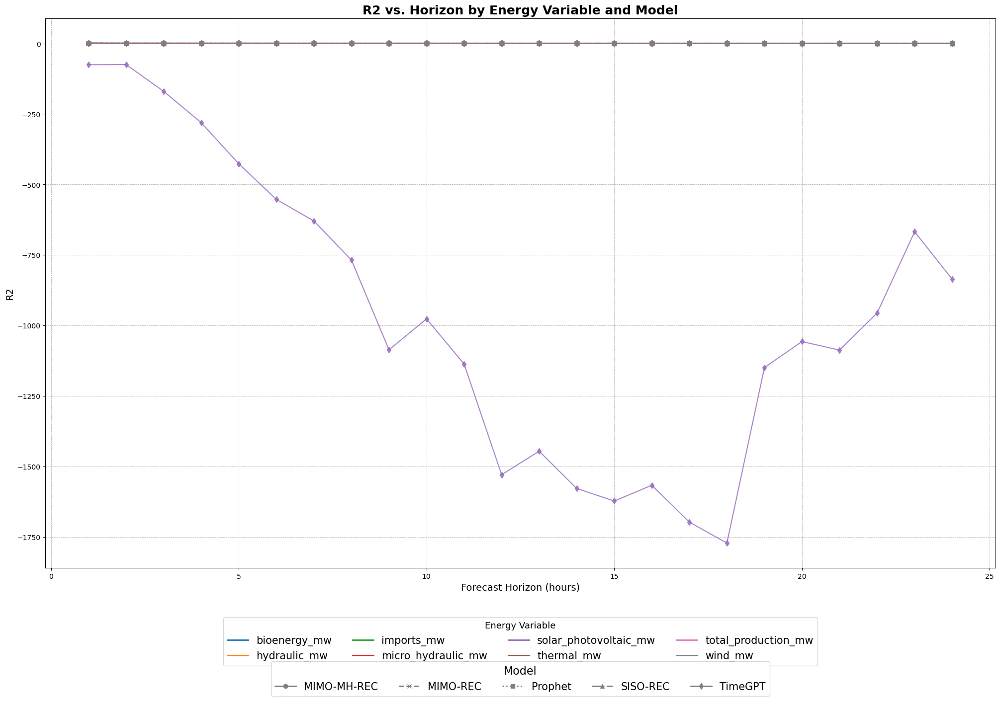

    - Generating Plot 4: Metrics by Energy Variable (Subplot View)...
      - Plotting nRMSE...
Figure saved: figures/nrmse_by_variable_subplots.png


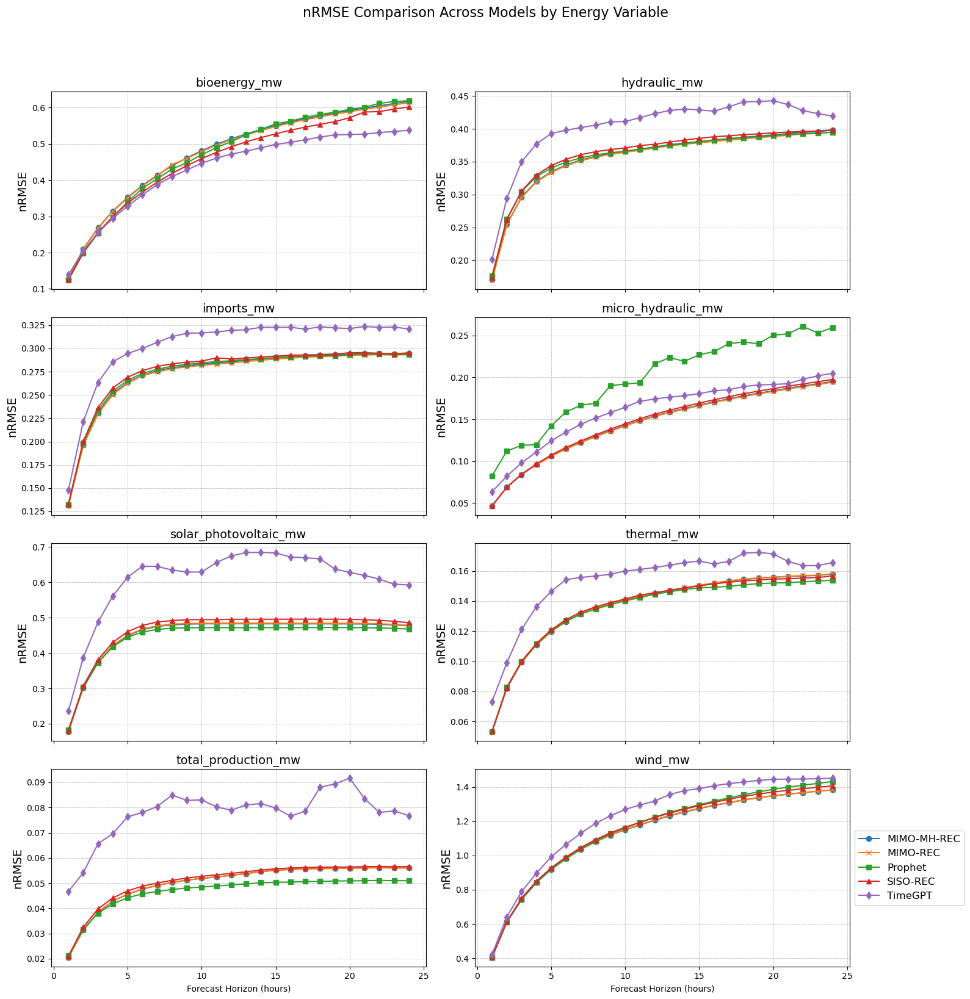

      - Plotting R2...
Figure saved: figures/r2_by_variable_subplots.png


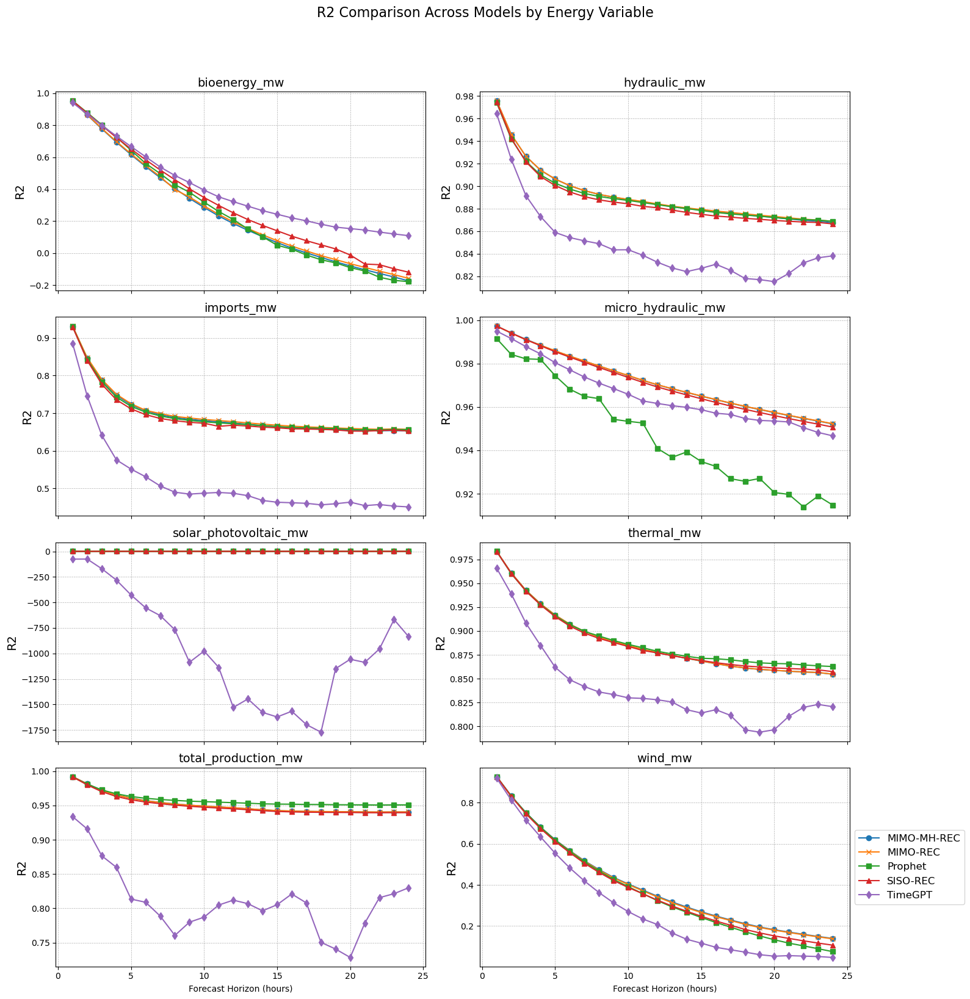

      - Plotting nMAE...
Figure saved: figures/nmae_by_variable_subplots.png


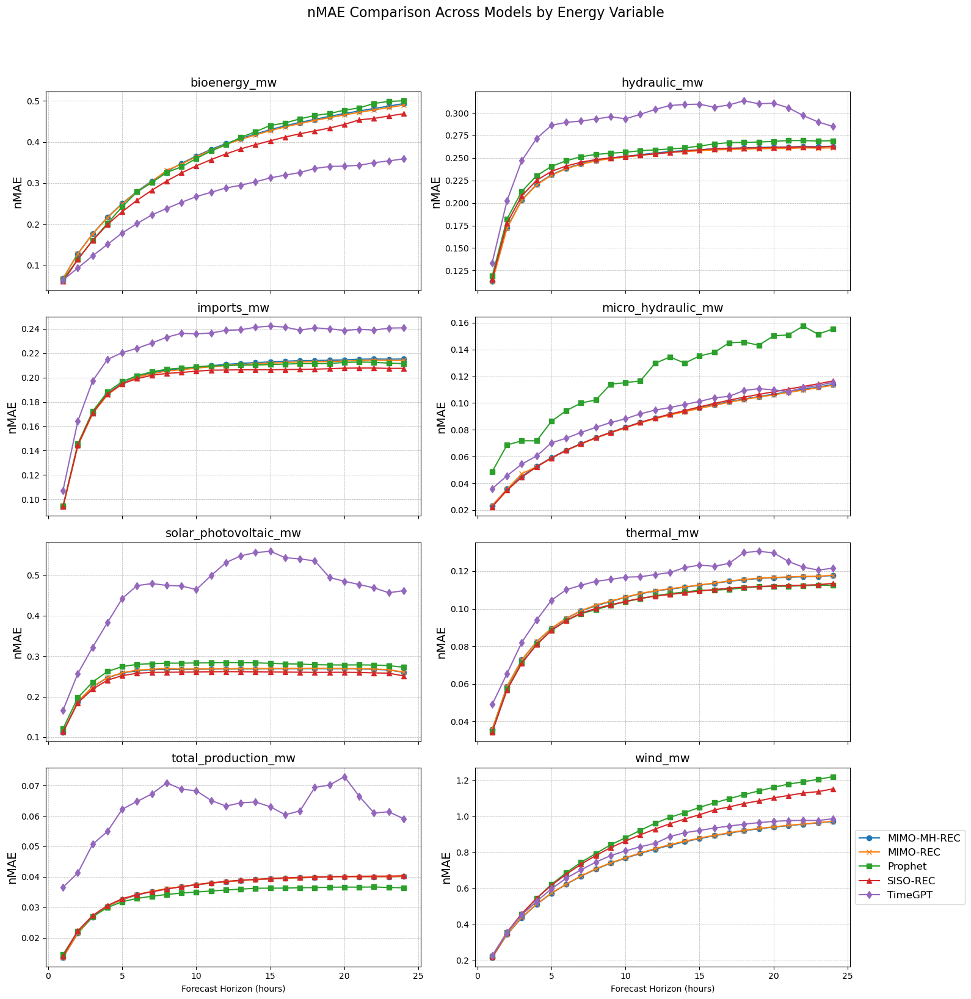

      - Plotting nMBE...
Figure saved: figures/nmbe_by_variable_subplots.png


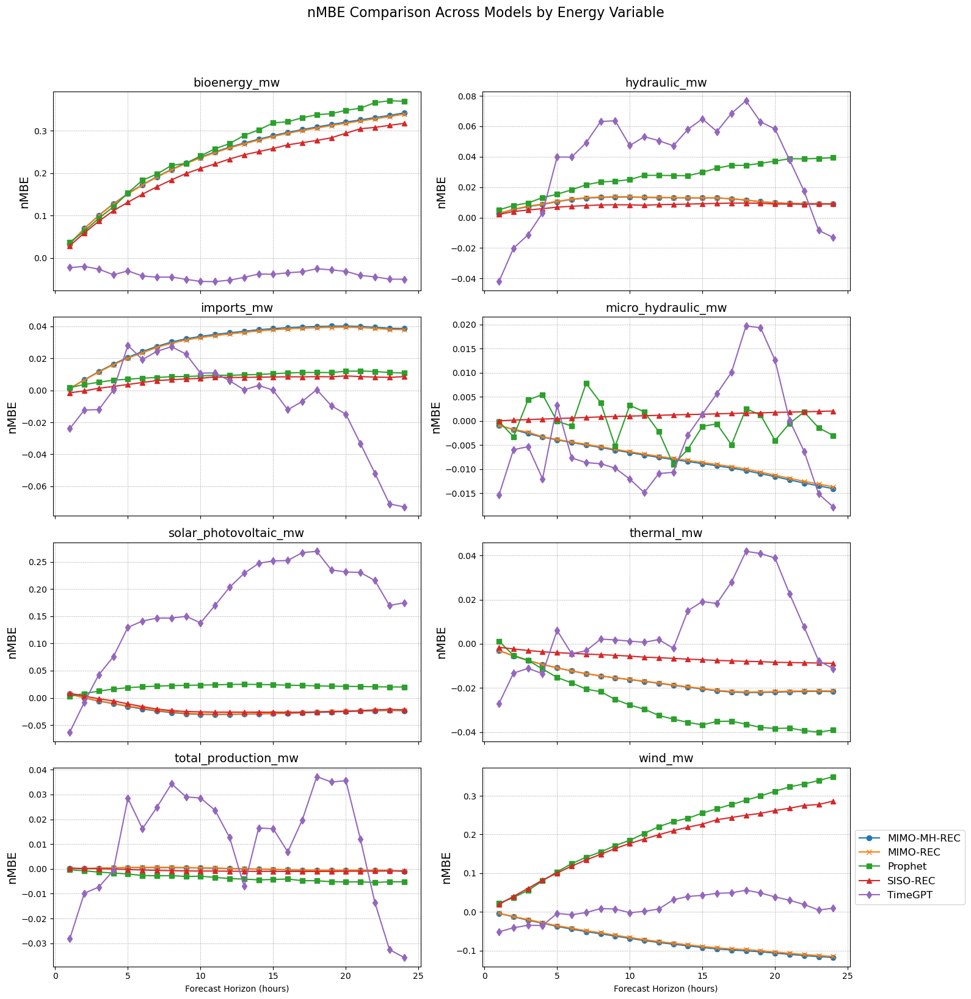

>>> Plot generation complete.

    - Generating Plot 5: Reconciliation Improvement (% in nRMSE)...
Figure saved: figures/reconciliation_improvement.png


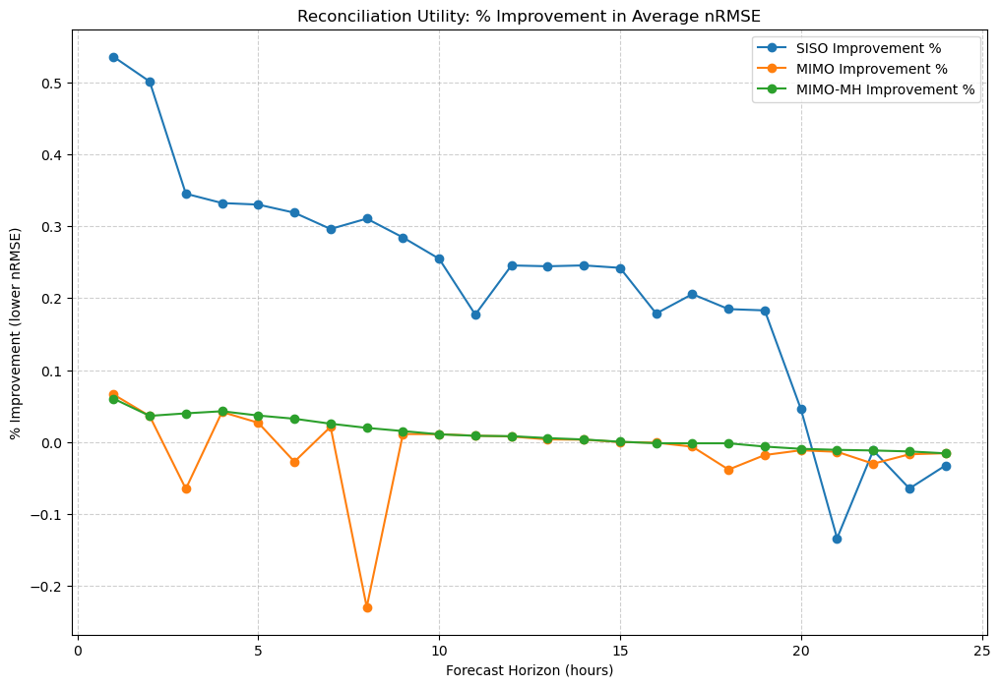

    - Generating Plot 6: Model Execution Times...


C:\Users\yoan\Downloads\STAGE\V3-Program_SISO_Prophet_Time_gpt_MIMO_MIMO-MH\plotting.py:421: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=45, ha='right')


Figure saved: figures/model_execution_times.png


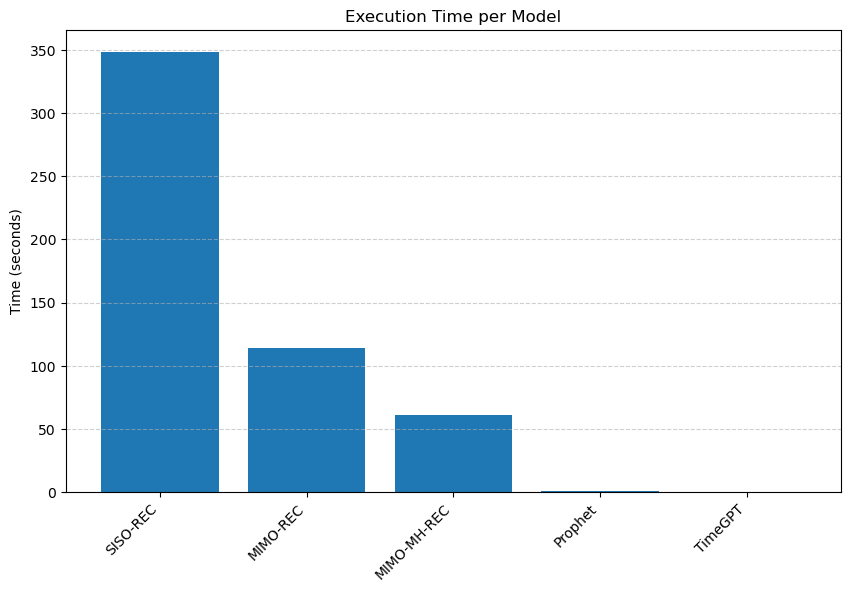

In [2]:
main.main()